In [1]:
import numpy as np
import pandas as pd
import anndata
import scanpy 
import pickle as pkl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from umap import UMAP
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=UserWarning)

In [2]:
scanpy.__version__

'1.9.8'

In [3]:
import torch

In [4]:
torch.__version__

'2.10.0+cu128'

In [5]:
print(torch.__version__)
print(torch.version.cuda)
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))
print(torch.cuda.get_device_capability(0))

2.10.0+cu128
12.8
True
NVIDIA GeForce RTX 5070 Ti
(12, 0)


In [6]:
torch.manual_seed(0)


In [7]:
import scvi

In [8]:
scvi.__version__

'1.1.1'

In [9]:
scvi.settings.seed = 1

Seed set to 1


In [10]:
import matplotlib
matplotlib.rcParams['svg.fonttype'] = 'none'
scanpy.settings.vector_friendly = False

In [11]:
matplotlib.rcParams['font.family'] = 'Arial'

In [12]:
def recluster_kluster(adata, recluster_group: str, k: int, recluster_key: str, original_labels='leiden', use_rep='X_scVI', prefix='k'):
    """
    Reclusters a specific cluster within an AnnData object using kNN (by recalculating the neighborhood graph) 
    and KMeans clustering, aimed at refining clustering within a specific previously identified group (e.g., a Leiden cluster).
    This function updates the adata object by storing the reclustered labels in a specified column, while cells not in the 
    target group retain their original cluster labels. New clusters are prefixed to distinguish them from existing labels.
    
    Parameters:
    - adata (AnnData): The AnnData object containing the dataset to be reclustered.
    - recluster_group (str): Label of the cluster to be reclustered, targeting cells within this cluster for reclustering.
    - k (int): Number of clusters to form within the targeted group.
    - recluster_key (str): Key in `adata.obs` under which to store new cluster labels.
    - original_labels (str, optional): Key in `adata.obs` where original cluster labels are stored. Defaults to 'leiden'.
    - use_rep (str, optional): Key in `adata.obsm` indicating the data representation for recalculating neighbors and 
      performing KMeans clustering. Defaults to 'X_scVI', which uses the representation learned by scVI.
    - prefix (str, optional): String prefix for new cluster labels to ensure uniqueness and prevent label clashes. Defaults to 'k'.
    
    Returns:
    AnnData: The original AnnData object with updated clustering labels in `recluster_key`.
    """
    
    # Ensure the recluster_key exists in adata.obs, initialize with original Leiden labels
    if recluster_key not in adata.obs:
        adata.obs[recluster_key] = adata.obs[original_labels].astype('category')
    
    # Step 1: Subset the AnnData object for the specific Leiden cluster
    adata_subset = adata[adata.obs[original_labels] == recluster_group].copy()

    # Step 2: Recalculate the neighborhood graph for the subset
    scanpy.pp.neighbors(adata_subset, use_rep=use_rep)
    
    # Step 3: Recluster the subset using KMeans
    kmeans = KMeans(n_clusters=k, random_state=0).fit(adata_subset.obsm[use_rep])
    
    # Prefix the new labels with "k" to ensure uniqueness
    new_labels = [f"{prefix}{label}" for label in kmeans.labels_.astype(str)]
    
    # Ensure the new labels are recognized as categories
    if recluster_key in adata.obs:
        existing_categories = set(adata.obs[recluster_key].cat.categories)
        new_categories = set(new_labels)
        all_categories = list(existing_categories.union(new_categories))
        adata.obs[recluster_key] = adata.obs[recluster_key].cat.set_categories(all_categories)
    
    # Update the recluster_key column for the reclustered group with prefixed labels
    indices = adata[adata.obs[original_labels] == recluster_group].obs.index
    adata.obs.loc[indices, recluster_key] = new_labels

    adata.obs[recluster_key] = adata.obs[recluster_key].cat.remove_unused_categories()
    
    return adata

In [14]:
#pd.read_csv('../data/2024_ref/rso.2024.counts.tab', sep='\t', index_col=0).T.to_csv('../data/2024_ref/rso.2024.counts.csv')


In [15]:
s_genes = [
    "MCM5", "PCNA", "TYMS", "FEN1", "MCM2", "MCM4", "RRM1", "UNG", "GINS2", "MCM6",
    "CDCA7", "DTL", "PRIM1", "UHRF1", "HELLS", "RFC2", "RPA2", "NASP", "RAD51AP1",
    "GMNN", "WDR76", "SLBP", "CCNE2", "UBR7", "POLD3", "MSH2", "ATAD2", "RAD51",
    "RRM2", "CDC45", "CDC6", "EXO1", "TIPIN", "DSCC1", "BLM", "CASP8AP2", "USP1",
    "CLSPN", "POLA1", "CHAF1B", "BRIP1", "E2F8"
]

g2m_genes = [
    "HMGB2", "CDK1", "NUSAP1", "UBE2C", "BIRC5", "TPX2", "TOP2A", "NDC80", "CKAP5",
    "MKI67", "TMPO", "CENPF", "TACC3", "SMC4", "CCNB2", "CKS2", "CDC20",
    "TTK", "CDC25C", "KIF2C", "RANGAP1", "NCAPD2", "DLGAP5", "CDCA2", "CDCA3",
    "CDCA8", "ECT2", "KIF23", "HMMR", "AURKB", "PSRC1", "ANLN", "LBR", "CKAP2",
    "CKAP2L", "AHCTF1", "RHNO1", "DYNLT1", "UBE2S", "BUB1", "KIF11",
    "ANP32E", "TUBB4B", "GTSE1", "KIF20B", "HJURP", "CDCA5", "SPC25", "NUF2",
    "CENPE", "CTCF", "NEK2", "G2E3", "GAS2L3", "CBX5", "CENPA"
]

cell_cycle_genes = s_genes + g2m_genes

esophageal_differentiation_genes = [
    "IVL",    # Involucrin, involved in the formation of the cornified cell envelope
    "KRT4",   # Keratin 4, expressed in differentiating layers of the esophageal epithelium
    "KRT13",  # Keratin 13, involved in the maintenance of epithelial integrity
    "TP63",   # Tumor protein p63, crucial for the proliferation potential of stem cells in epithelial development
    "SPRR1A", # Small proline-rich protein 1A, involved in cornified envelope formation
    "SPRR2A", # Small proline-rich protein 2A, involved in skin barrier formation and repair
    "SPRR3",  # Small proline-rich protein 3, contributes to the physical properties of the cornified envelope
    "TGM1",   # Transglutaminase 1, involved in the cross-linking of proteins and the formation of the cornified cell envelope
    "DSC3",   # Desmocollin 3, involved in cell-cell adhesion in epithelial cells
    "DSG1",   # Desmoglein 1, a component of desmosomes, involved in cell adhesion and signaling
    "PKP1",   # Plakophilin 1, a component of desmosomes, playing a role in cell adhesion and the structural integrity of epithelial tissues
    "KRT5",   # Keratin 5, a basal cell marker that forms filaments with keratin 14
    "KRT14",  # Keratin 14, a basal cell marker that forms filaments with keratin 5
    "SOX2",   # SRY (sex determining region Y)-box 2, involved in the maintenance and differentiation of stem cells
    "NOTCH1", # Notch 1, involved in cell differentiation decisions
    "NOTCH2", # Notch 2, plays a role in the regulation of differentiation in squamous epithelia
    "NOTCH3", # Notch 3, involved in the Notch signaling pathway, affecting cell fate determination
]


basal_epithelial_genes = [
    "KRT5",    # Keratin 5, a hallmark of basal epithelial cells
    "KRT14",   # Keratin 14, often co-expressed with KRT5 in basal cells
    "TP63",    # Tumor protein p63, a key transcription factor in basal progenitor cells
    "ITGA6",   # Integrin alpha 6, a cell surface marker for basal epithelial cells
    "CD44",    # CD44, involved in cell-cell interactions, cell adhesion and migration
    "SFRP1",   # Secreted frizzled-related protein 1, modulating Wnt signaling
    "NGFR",    # Nerve growth factor receptor, also known as CD271, marker of stem cells in basal layer
    "SOX9",    # SRY-Box Transcription Factor 9, involved in development and stem cell maintenance
    "LAMA3",   # Laminin subunit alpha 3, a component of the basement membrane
    "COL17A1", # Collagen Type XVII Alpha 1 Chain, a structural molecule in the basement membrane zone
]



In [16]:
rso = scanpy.read_text('../data/2024_ref/plus-cu08/rso.2026.counts.csv', delimiter=',')
rso.obs['sample'] = list(rso.obs.index.str.split('_').str[0])
rso.obs['plate'] = list(rso.obs.index.str.split('_').str[1].str[:2])
rso.obs['batch'] = rso.obs[['sample','plate']].apply(lambda x: '_'.join(x), axis=1)
rso.obs['well'] = rso.obs.index.str.extract(r'(\D\d+)$').values.flatten().tolist()
rso.obs['row'] = rso.obs.well.str.extract(r'(\D+)').values.flatten().tolist()
rso.obs['col'] = rso.obs.well.str.extract(r'(\d+)$').values.flatten().tolist()
rso.obs['replicate'] = rso.obs.index.str.extract(r'r(\d+)').fillna('-1').values.flatten().tolist()


In [17]:
blacklist = ['__no_feature', '__ambiguous','__alignment_not_unique','__too_low_aQual','__not_aligned']

In [18]:
rso = rso[:,np.in1d(rso.var_names, blacklist, invert=True)]


In [19]:
rso.obs

,sample,plate,batch,well,row,col,replicate
cu03_p3r3J23,cu03,p3,cu03_p3,J23,J,23,3
cu02_p1r3J8,cu02,p1,cu02_p1,J8,J,8,3
cu01_p2r1B11,cu01,p2,cu01_p2,B11,B,11,1
cu01_p1r1B7,cu01,p1,cu01_p1,B7,B,7,1
cu02_p3r1B13,cu02,p3,cu02_p3,B13,B,13,1
...,...,...,...,...,...,...,...
cu08_p2r4M8,cu08,p2,cu08_p2,M8,M,8,4
cu08_p2r4J2,cu08,p2,cu08_p2,J2,J,2,4
cu08_p2r1B7,cu08,p2,cu08_p2,B7,B,7,1
cu08_p3r2F18,cu08,p3,cu08_p3,F18,F,18,2


In [20]:
# Read the lines of the file "missing.txt" into a set
with open('missing.txt', 'r') as file:
    missing_set = set(line.strip() for line in file)


In [21]:
len(missing_set)

137

In [22]:
rso.obs_names.isin(missing_set).sum()

115

In [23]:
[x for x in missing_set if x not in rso.obs_names]


['cu01_p1r2F4',
 'cu01_p1r2H4',
 'cu01_p1r2G10',
 'cu01_p1r4O7',
 'cu01_p1r4N18',
 'eso29_p2F6',
 'cu01_p1r4M7',
 'cu01_p1r3J4',
 'cu01_p1r3K2',
 'cu01_p1r3J8',
 'cu01_p1r2G24',
 'cu01_p1r2G12',
 'cu01_p1r2G6',
 'cu01_p1r1A11',
 'cu01_p1r1A7',
 'cu01_p1r3I1',
 'cu01_p1r2G14',
 'cu01_p1r1C11',
 'cu01_p1r2F8',
 'cu01_p1r4M1',
 'cu01_p1r2G18',
 'cu01_p1r3L6']

In [24]:
#miss = rso[rso.obs_names.isin(missing_set)]

In [25]:
#pd.DataFrame(miss.X, index=miss.obs_names, columns=miss.var_names).to_csv('../data/2024_ref/missing.csv')

In [26]:
rso.obs.groupby(['sample','plate',]).size()

sample  plate
cu01    p1       301
        p2       360
cu02    p1       358
        p2       360
        p3       361
cu03    p1       359
        p2       357
        p3       359
        p4       360
cu08    p1       142
        p2       367
        p3       383
eso29   p1        19
        p2        90
dtype: int64

In [27]:
metadata = pd.read_csv('../data/cellswithdna.regions.cu08.txt', sep='\t', index_col=0)[['region','sort','cm.from.mouth']]
metadata['cm.from.mouth'] = metadata['cm.from.mouth'].astype(str)
metadata['region'] = metadata['region'].astype(str)
metadata['sort'] = metadata['sort'].fillna("EPCAM+")


In [28]:
rso.obs = rso.obs.join(metadata, how='left')
rso.obs['Paired DNA'] = rso.obs['cm.from.mouth'].str.contains('.').fillna(False)

In [29]:
rso.obs['prior_cell_type'] = rso.obs.index.map(pd.read_csv('rso_cell_type.csv', header=0, index_col=0).to_dict()['cell_type'])


In [30]:
with open('../data/gene_dict.pkl', 'rb') as f:
    hgnc_to_ensembl = pkl.load(f)

In [31]:
ensembl_to_hgnc = {v: k for k, v in hgnc_to_ensembl.items()}

In [32]:
def get_value_or_key(dictionary, key):
    return dictionary.get(key, key)

In [33]:
rso.var_names = [get_value_or_key(ensembl_to_hgnc, x) for x in rso.var_names]

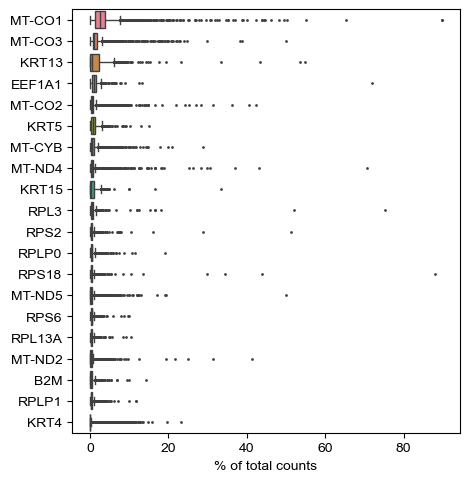

In [34]:
scanpy.pl.highest_expr_genes(rso, n_top=20)

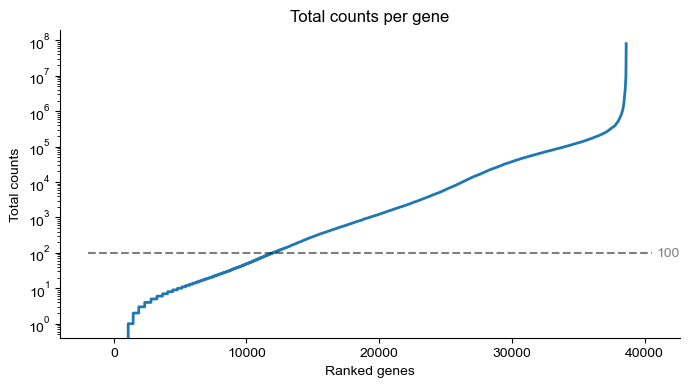

In [35]:
plt.figure(figsize=(8, 4))
plt.plot(np.sort(rso.X.sum(axis=0)), linewidth=2)
plt.yscale('log')
plt.hlines(100, *plt.xlim(), color='k', linestyle='--', alpha=0.5)
plt.text(plt.xlim()[1], 100, '100', ha='right', va='center', color='k', alpha=0.5)
plt.title('Total counts per gene')
plt.ylabel('Total counts')
plt.xlabel('Ranked genes')
sns.despine()

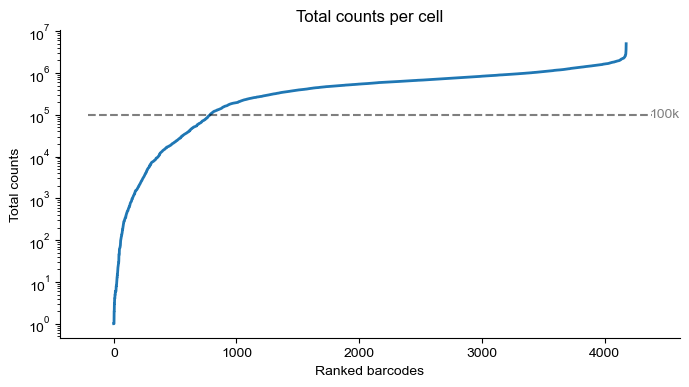

In [36]:
plt.figure(figsize=(8, 4))
plt.plot(np.sort(rso.X.sum(axis=1)), linewidth=2)
plt.yscale('log')
plt.hlines(100000, *plt.xlim(), color='k', linestyle='--', alpha=0.5)
plt.text(plt.xlim()[1], 100000, '100k', ha='right', va='center', color='k', alpha=0.5)
plt.title('Total counts per cell')
plt.ylabel('Total counts')
plt.xlabel('Ranked barcodes')
sns.despine()

In [37]:
scanpy.pp.filter_genes(rso, min_counts=100)
scanpy.pp.filter_genes(rso, min_cells=10)
scanpy.pp.filter_cells(rso, min_counts=200000)

In [38]:
rso.obs_names.isin(missing_set).sum()

10

In [39]:
# Identify mitochondrial and ribosomal genes
rso.var['mt'] = rso.var_names.str.startswith('MT-')
rso.var['ribo'] = rso.var_names.str.startswith(('RPS', 'RPL'))

# Calculate QC metrics
scanpy.pp.calculate_qc_metrics(rso, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)

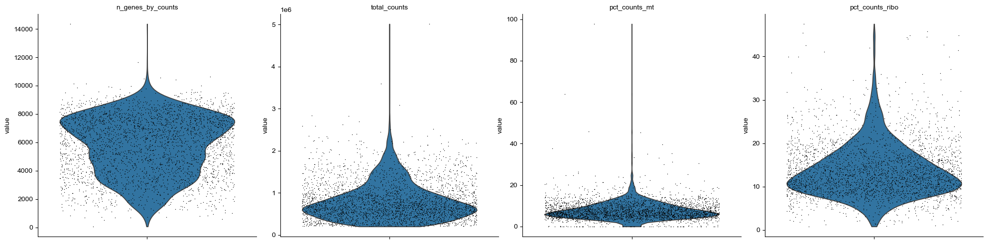

In [40]:
scanpy.pl.violin(rso, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

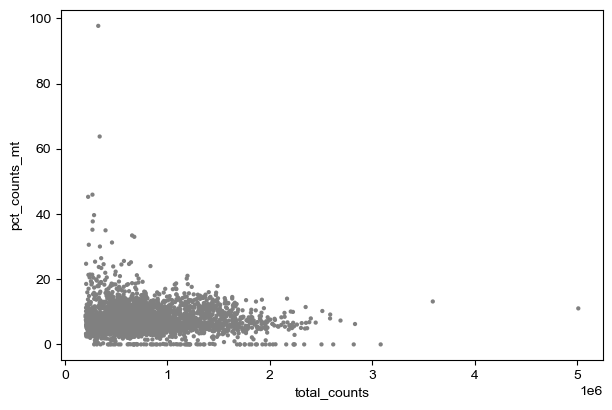

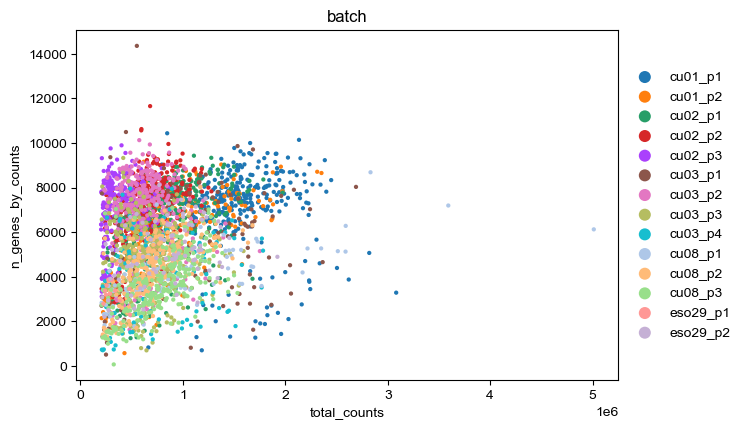

In [41]:
scanpy.pl.scatter(rso, x='total_counts', y='pct_counts_mt')
scanpy.pl.scatter(rso, x='total_counts', y='n_genes_by_counts', color='batch')

In [42]:
rso = rso[rso.obs.pct_counts_mt < 20, :]
rso = rso[rso.obs.pct_counts_ribo < 40, :]

#rso = rso[(rso.obs.pct_counts_mt > 3) & (rso.obs.pct_counts_mt < 30), :]
#rso = rso[(rso.obs.pct_counts_ribo > 3) & (rso.obs.pct_counts_ribo < 30), :]

In [43]:
rso.obs_names.isin(missing_set).sum()

0

In [44]:
[x for x in missing_set if x in rso.obs_names]

[]

In [45]:
rso.layers['counts'] = rso.X.copy()
rso

AnnData object with n_obs × n_vars = 3109 × 26424
    obs: 'sample', 'plate', 'batch', 'well', 'row', 'col', 'replicate', 'region', 'sort', 'cm.from.mouth', 'Paired DNA', 'prior_cell_type', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_counts', 'n_cells', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'batch_colors'
    layers: 'counts'

In [46]:
scanpy.pp.normalize_total(rso, target_sum=1e4,)
scanpy.pp.log1p(rso)
rso.raw = rso

In [47]:
#pd.DataFrame(rso.raw.X, index=rso.obs_names, columns=rso.raw.var_names).to_csv('../data/2024_ref/rso.2024.nrom_counts.csv')

In [48]:
#scanpy.tl.score_genes_cell_cycle(rso, s_genes=s_genes, g2m_genes=g2m_genes)

In [49]:
scanpy.pp.highly_variable_genes(
    rso,
    flavor="seurat_v3",
    layer="counts",
    n_top_genes=1000,
    batch_key="batch",
    subset=True,
)

In [50]:
rso.obs

,sample,plate,batch,well,row,col,replicate,region,sort,cm.from.mouth,Paired DNA,prior_cell_type,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
cu03_p3r3J23,cu03,p3,cu03_p3,J23,J,23,3,B,CD45+,27.0,True,NaN,581631.0,2057,581631.0,28679.0,4.930789,75554.0,12.990024
cu02_p1r3J8,cu02,p1,cu02_p1,J8,J,8,3,3,EPCAM+,24.0,True,Basal Epithelial,522094.0,5540,522094.0,47116.0,9.024428,97532.0,18.680927
cu01_p2r1B11,cu01,p2,cu01_p2,B11,B,11,1,C,EPCAM+,31.0,True,Suprabasal Epithelial,1124900.0,7399,1124900.0,75560.0,6.717042,129948.0,11.551960
cu01_p1r1B7,cu01,p1,cu01_p1,B7,B,7,1,B,EPCAM+,25.0,True,Basal Epithelial,1314627.0,7514,1314627.0,143507.0,10.916177,176871.0,13.454082
cu02_p1r4O6,cu02,p1,cu02_p1,O6,O,6,4,3,EPCAM+,24.0,True,Suprabasal Epithelial,1116295.0,6048,1116295.0,68868.0,6.169337,206400.0,18.489737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cu08_p2r2F16,cu08,p2,cu08_p2,F16,F,16,2,B,EPCAM+,39.0,True,NaN,965920.0,4805,965920.0,129161.0,13.371812,179769.0,18.611168
cu08_p2r4J2,cu08,p2,cu08_p2,J2,J,2,4,B,EPCAM+,39.0,True,NaN,428769.0,5085,428769.0,49588.0,11.565202,97599.0,22.762608
cu08_p2r1B7,cu08,p2,cu08_p2,B7,B,7,1,B,EPCAM+,39.0,True,NaN,920152.0,5804,920152.0,89366.0,9.712091,149271.0,16.222427
cu08_p3r2F18,cu08,p3,cu08_p3,F18,F,18,2,C,EPCAM+,33.0,True,NaN,1250492.0,7017,1250492.0,55504.0,4.438573,255464.0,20.429079


In [51]:
scvi.model.SCVI.setup_anndata(
    rso,
    layer="counts",
    categorical_covariate_keys=["sample", "batch", "plate","replicate",], #"phase"
    #continuous_covariate_keys=["pct_counts_mt","pct_counts_ribo",], #'S_score', 'G2M_score',
)



In [52]:
model = scvi.model.SCVI(
    rso,
    n_layers=1,
    n_hidden=128,
    n_latent=10,
    )

In [53]:
model

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal.
Training status: Not Trained
Model's adata is minified?: False

In [54]:
rso.obs.groupby(['sample','plate',]).size()


sample  plate
cu01    p1       300
        p2       310
        p3         0
        p4         0
cu02    p1       336
        p2       325
        p3       243
        p4         0
cu03    p1       112
        p2       344
        p3       337
        p4        92
cu08    p1       100
        p2       246
        p3       272
        p4         0
eso29   p1        13
        p2        79
        p3         0
        p4         0
dtype: int64

In [55]:
#torch.set_float32_matmul_precision('high')
model.train(max_epochs=400)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 5070 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [01:26<00:00,  4.89it/s, v_num=1, train_loss_step=2.36e+3, train_loss_epoch=2.39e+3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:26<00:00,  4.64it/s, v_num=1, train_loss_step=2.36e+3, train_loss_epoch=2.39e+3]


In [56]:
latent = model.get_latent_representation()
rso.obsm["X_scVI"] = latent

In [57]:
scanpy.pp.neighbors(rso, use_rep="X_scVI", n_neighbors=170,) # 170

In [58]:
scanpy.tl.umap(rso, min_dist=0.66, spread=1.,)
#scanpy.tl.draw_graph(rso, layout="fa")

In [59]:
scanpy.pp.neighbors(rso, use_rep="X_umap", n_neighbors=170,)

In [80]:
scanpy.tl.leiden(rso, resolution=0.6)

In [61]:
rso.obs['sort'] = rso.obs['sort'].fillna('EPCAM+')

In [62]:
rso.uns['sort_colors'] = ['#e32636', '#5d8aa8']

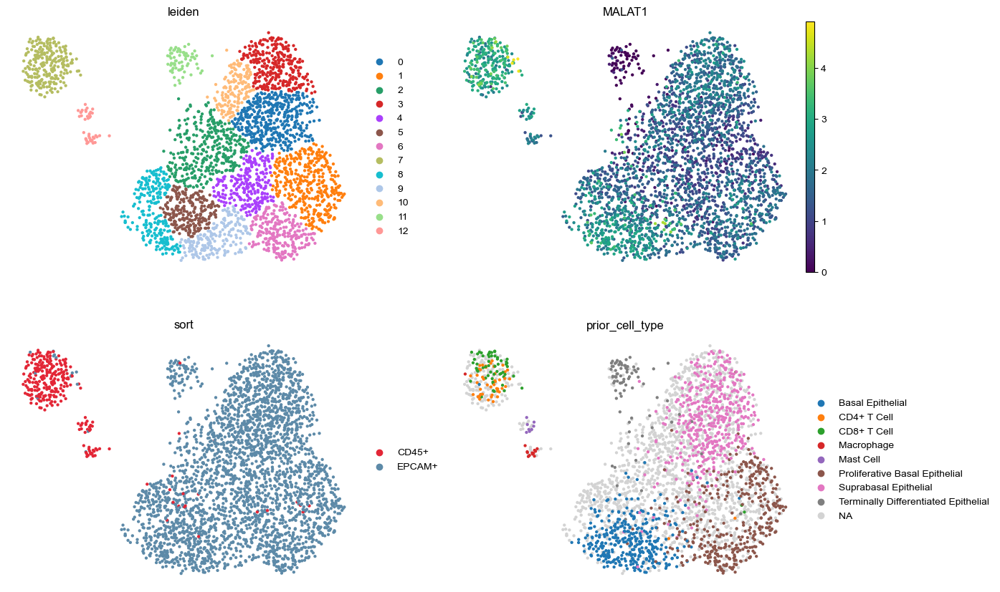

In [81]:
scanpy.pl.umap(rso, color=['leiden','MALAT1','sort', 'prior_cell_type'], ncols=2, frameon=False)

In [64]:
rso.obs['sample']

cu03_p3r3J23    cu03
cu02_p1r3J8     cu02
cu01_p2r1B11    cu01
cu01_p1r1B7     cu01
cu02_p1r4O6     cu02
                ... 
cu08_p2r2F16    cu08
cu08_p2r4J2     cu08
cu08_p2r1B7     cu08
cu08_p3r2F18    cu08
cu08_p3r1B21    cu08
Name: sample, Length: 3109, dtype: category
Categories (5, object): ['cu01', 'cu02', 'cu03', 'cu08', 'eso29']


Summary statistics by sample:
       n_genes_by_counts                            total_counts  \
                    mean          std   min    max          mean   
sample                                                             
cu01         6590.531148  1844.237361   575  10432  1.182621e+06   
cu02         6906.181416  1647.920492  1245  11649  6.491727e+05   
cu03         5570.790960  2097.656364   509  14350  7.235717e+05   
cu08         4076.265372  1310.585782   999   8683  8.003832e+05   
eso29        4954.228261  1403.523612  2208   8110  7.811816e+05   

                                           pct_counts_mt                      \
                  std       min        max          mean       std       min   
sample                                                                         
cu01    559510.744075  206778.0  3081895.0      7.654510  3.661075  0.000000   
cu02    308668.950832  200865.0  1973820.0      7.326471  3.333279  0.000000   
cu03    351672.543482  2

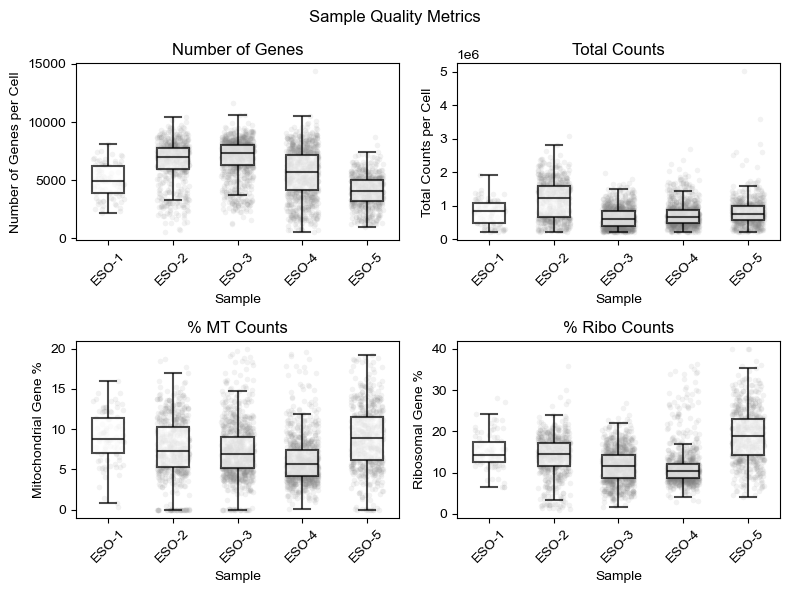

In [ ]:
sample_rename = {
    'eso29':'ESO-1',
    'cu01':'ESO-2', 
    'cu02':'ESO-3',
    'cu03':'ESO-4',
    'cu08':'ESO-5',
}

# Get summary statistics for each sample
sample_stats = rso.obs.groupby('sample')[['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo']].agg(['mean', 'std', 'min', 'max'])

# Display the results
print("\nSummary statistics by sample:")
print(sample_stats)

# Create stripplots with boxplots for each metric
fig, axes = plt.subplots(2, 2, figsize=(8, 6))
fig.suptitle('Sample Quality Metrics')

# Plot each metric
metrics = ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo']
titles = ['Number of Genes', 'Total Counts', '% MT Counts', '% Ribo Counts']
y_labels = ['Number of Genes per Cell', 'Total Counts per Cell', 'Mitochondrial Gene %', 'Ribosomal Gene %']

for idx, (metric, title, y_label) in enumerate(zip(metrics, titles, y_labels)):
    row = idx // 2
    col = idx % 2
    
    # Add stripplot first (will be in background)
    sns.stripplot(data=rso.obs, x='sample', y=metric, ax=axes[row, col],
                  size=4, alpha=0.1, jitter=0.25, color='gray', order=['eso29', 'cu01', 'cu02', 'cu03', 'cu08'])
    
    # Add boxplot on top with clear visibility
    sns.boxplot(data=rso.obs, x='sample', y=metric, ax=axes[row, col], 
                color='white', width=0.5, showfliers=False, notch=False,
                linewidth=1.5, boxprops=dict(alpha=0.7, edgecolor='black'), medianprops=dict(alpha=0.7, color='black'),
                capprops=dict(alpha=0.7, color='black'), whiskerprops=dict(alpha=0.7, color='black'), zorder=10,
                flierprops=dict(alpha=0.7, color='black'), order=['eso29', 'cu01', 'cu02', 'cu03', 'cu08'])
    
    axes[row, col].set_title(title)
    axes[row, col].set_ylabel(y_label)
    axes[row, col].tick_params(axis='x', rotation=45)
    axes[row, col].set_xlabel('Sample')
    
    # Apply sample name mapping to x-axis labels
    axes[row, col].set_xticklabels([sample_rename.get(x.get_text(), x.get_text()) for x in axes[row, col].get_xticklabels()])

plt.tight_layout()
#plt.savefig('sample_quality_metrics_not_notched.pdf', bbox_inches='tight', dpi=300, transparent=True)



Summary statistics by sample:
       n_genes_by_counts                            total_counts  \
                    mean          std   min    max          mean   
sample                                                             
cu01         6590.531148  1844.237361   575  10432  1.182621e+06   
cu02         6906.181416  1647.920492  1245  11649  6.491727e+05   
cu03         5570.790960  2097.656364   509  14350  7.235717e+05   
cu08         4076.265372  1310.585782   999   8683  8.003832e+05   
eso29        4954.228261  1403.523612  2208   8110  7.811816e+05   

                                           pct_counts_mt                      \
                  std       min        max          mean       std       min   
sample                                                                         
cu01    559510.744075  206778.0  3081895.0      7.654510  3.661075  0.000000   
cu02    308668.950832  200865.0  1973820.0      7.326471  3.333279  0.000000   
cu03    351672.543482  2

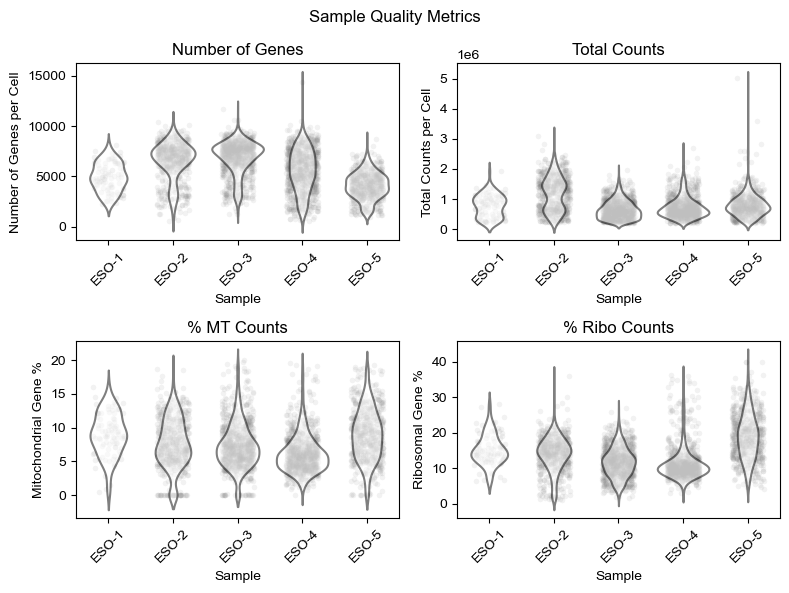

In [ ]:
sample_rename = {
    'eso29':'ESO-1',
    'cu01':'ESO-2', 
    'cu02':'ESO-3',
    'cu03':'ESO-4',
    'cu08':'ESO-5',
}

# Get summary statistics for each sample
sample_stats = rso.obs.groupby('sample')[['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo']].agg(['mean', 'std', 'min', 'max'])

# Display the results
print("\nSummary statistics by sample:")
print(sample_stats)

# Create stripplots with violin plots for each metric
fig, axes = plt.subplots(2, 2, figsize=(8, 6))
fig.suptitle('Sample Quality Metrics')

# Plot each metric
metrics = ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo']
titles = ['Number of Genes', 'Total Counts', '% MT Counts', '% Ribo Counts']
y_labels = ['Number of Genes per Cell', 'Total Counts per Cell', 'Mitochondrial Gene %', 'Ribosomal Gene %']

for idx, (metric, title, y_label) in enumerate(zip(metrics, titles, y_labels)):
    row = idx // 2
    col = idx % 2
    
    # Add stripplot first (will be in background)
    sns.stripplot(data=rso.obs, x='sample', y=metric, ax=axes[row, col],
                  size=4, alpha=0.1, jitter=0.25, color='gray', order=['eso29', 'cu01', 'cu02', 'cu03', 'cu08'])
    
    # Add violin plot on top with clear visibility
    sns.violinplot(data=rso.obs, x='sample', y=metric, ax=axes[row, col],
                   color='white', width=0.8, inner=None,
                   linewidth=1.5, edgecolor='black', zorder=10,
                   order=['eso29', 'cu01', 'cu02', 'cu03', 'cu08'], alpha=0.5)
    
    axes[row, col].set_title(title)
    axes[row, col].set_ylabel(y_label)
    axes[row, col].tick_params(axis='x', rotation=45)
    axes[row, col].set_xlabel('Sample')
    
    # Apply sample name mapping to x-axis labels
    axes[row, col].set_xticklabels([sample_rename.get(x.get_text(), x.get_text()) for x in axes[row, col].get_xticklabels()])

plt.tight_layout()
#plt.savefig('sample_quality_metrics_violin.pdf', bbox_inches='tight', dpi=300, transparent=True)


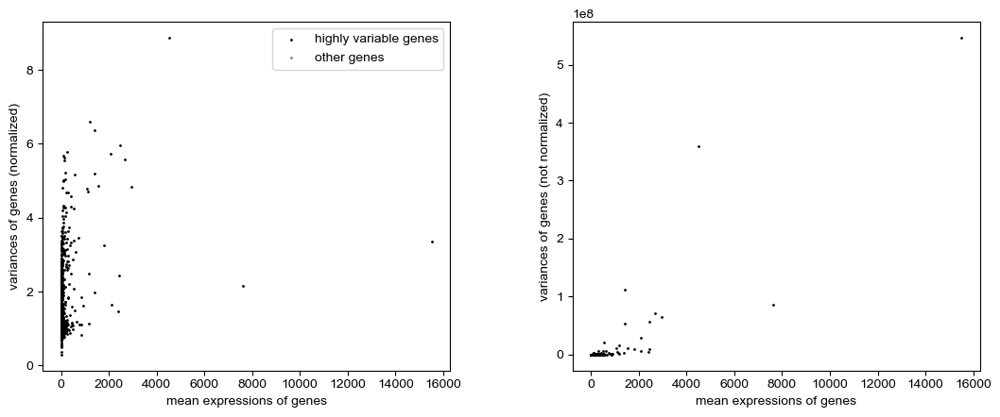

In [67]:
scanpy.pl.highly_variable_genes(rso)

In [68]:
rso.obs

,sample,plate,batch,well,row,col,replicate,region,sort,cm.from.mouth,...,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden
cu03_p3r3J23,cu03,p3,cu03_p3,J23,J,23,3,B,CD45+,27.0,...,581631.0,2057,581631.0,28679.0,4.930789,75554.0,12.990024,0,0,7
cu02_p1r3J8,cu02,p1,cu02_p1,J8,J,8,3,3,EPCAM+,24.0,...,522094.0,5540,522094.0,47116.0,9.024428,97532.0,18.680927,0,0,5
cu01_p2r1B11,cu01,p2,cu01_p2,B11,B,11,1,C,EPCAM+,31.0,...,1124900.0,7399,1124900.0,75560.0,6.717042,129948.0,11.551960,0,0,3
cu01_p1r1B7,cu01,p1,cu01_p1,B7,B,7,1,B,EPCAM+,25.0,...,1314627.0,7514,1314627.0,143507.0,10.916177,176871.0,13.454082,0,0,9
cu02_p1r4O6,cu02,p1,cu02_p1,O6,O,6,4,3,EPCAM+,24.0,...,1116295.0,6048,1116295.0,68868.0,6.169337,206400.0,18.489737,0,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cu08_p2r2F16,cu08,p2,cu08_p2,F16,F,16,2,B,EPCAM+,39.0,...,965920.0,4805,965920.0,129161.0,13.371812,179769.0,18.611168,0,0,5
cu08_p2r4J2,cu08,p2,cu08_p2,J2,J,2,4,B,EPCAM+,39.0,...,428769.0,5085,428769.0,49588.0,11.565202,97599.0,22.762608,0,0,4
cu08_p2r1B7,cu08,p2,cu08_p2,B7,B,7,1,B,EPCAM+,39.0,...,920152.0,5804,920152.0,89366.0,9.712091,149271.0,16.222427,0,0,1
cu08_p3r2F18,cu08,p3,cu08_p3,F18,F,18,2,C,EPCAM+,33.0,...,1250492.0,7017,1250492.0,55504.0,4.438573,255464.0,20.429079,0,0,4


In [69]:
scanpy.tl.score_genes_cell_cycle(rso, s_genes=s_genes, g2m_genes=g2m_genes)
scanpy.tl.score_genes(rso, esophageal_differentiation_genes, use_raw=True, score_name='esophageal_diff_score')
scanpy.tl.score_genes(rso, basal_epithelial_genes, use_raw=True, score_name='basal_epithelial_score')


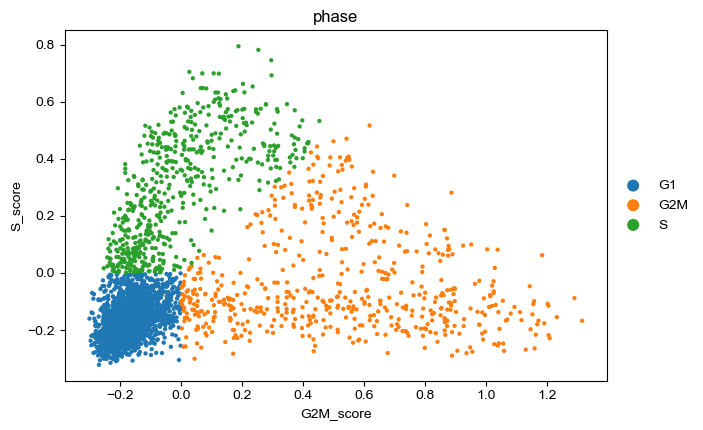

In [70]:
scanpy.pl.scatter(rso, x='G2M_score', y='S_score', color='phase', use_raw=True)

In [71]:
rso.obs

,sample,plate,batch,well,row,col,replicate,region,sort,cm.from.mouth,...,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,S_score,G2M_score,phase,esophageal_diff_score,basal_epithelial_score
cu03_p3r3J23,cu03,p3,cu03_p3,J23,J,23,3,B,CD45+,27.0,...,75554.0,12.990024,0,0,7,-0.158994,-0.145389,G1,0.421150,0.715441
cu02_p1r3J8,cu02,p1,cu02_p1,J8,J,8,3,3,EPCAM+,24.0,...,97532.0,18.680927,0,0,5,-0.134603,-0.230499,G1,0.174248,0.870321
cu01_p2r1B11,cu01,p2,cu01_p2,B11,B,11,1,C,EPCAM+,31.0,...,129948.0,11.551960,0,0,3,-0.160811,-0.186199,G1,0.981988,0.583248
cu01_p1r1B7,cu01,p1,cu01_p1,B7,B,7,1,B,EPCAM+,25.0,...,176871.0,13.454082,0,0,9,-0.148115,-0.206901,G1,0.352727,0.998738
cu02_p1r4O6,cu02,p1,cu02_p1,O6,O,6,4,3,EPCAM+,24.0,...,206400.0,18.489737,0,0,10,-0.190583,-0.195697,G1,1.052637,0.440008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cu08_p2r2F16,cu08,p2,cu08_p2,F16,F,16,2,B,EPCAM+,39.0,...,179769.0,18.611168,0,0,5,-0.128559,-0.153328,G1,0.052016,0.603355
cu08_p2r4J2,cu08,p2,cu08_p2,J2,J,2,4,B,EPCAM+,39.0,...,97599.0,22.762608,0,0,4,0.281612,-0.003010,S,0.203009,0.407359
cu08_p2r1B7,cu08,p2,cu08_p2,B7,B,7,1,B,EPCAM+,39.0,...,149271.0,16.222427,0,0,1,0.022565,0.791092,G2M,0.418680,0.702536
cu08_p3r2F18,cu08,p3,cu08_p3,F18,F,18,2,C,EPCAM+,33.0,...,255464.0,20.429079,0,0,4,0.075900,-0.148803,S,0.486777,0.337105


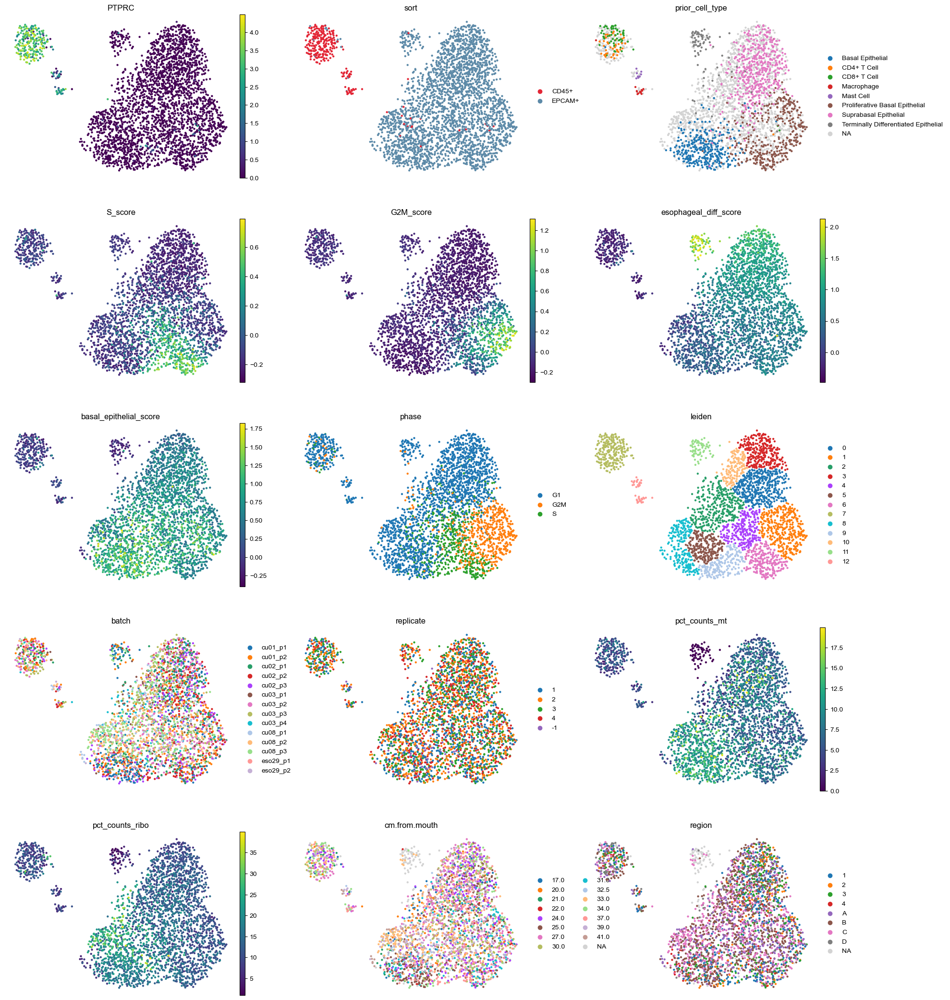

In [72]:
#scanpy.pl.umap(rso,color=['CD24','CD74','IL1R2','KRT14','KRT16','leiden','batch','sample','plate','replicate'],frameon=False)
#scanpy.pl.umap(rso,color=['PTPRC','leiden','batch','sample','plate','replicate','total_counts','pct_counts_mt',],frameon=False)
scanpy.pl.umap(rso, color=['PTPRC','sort', 'prior_cell_type','S_score', 'G2M_score','esophageal_diff_score','basal_epithelial_score','phase', 'leiden','batch','replicate','pct_counts_mt','pct_counts_ribo','cm.from.mouth','region', ], ncols=3, frameon=False, save='_rso_buncha_labels.pdf' ) # save='_rso_buncha_labels.svg'



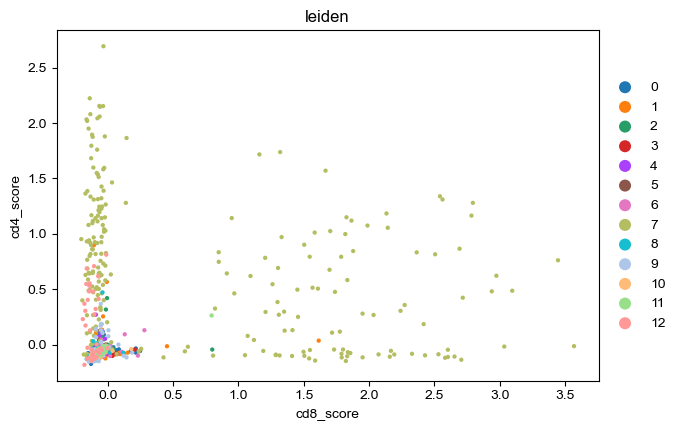

In [73]:
cd8_genes = [
    'CD8A',
    'CD8B',
]
cd4_genes = [
    'IL7R',
    'LTB',
    'CD4',
]
scanpy.tl.score_genes(rso, cd8_genes, use_raw=True, score_name='cd8_score')
scanpy.tl.score_genes(rso, cd4_genes, use_raw=True, score_name='cd4_score')
rso.obs['cd8_cd4_score'] = rso.obs['cd8_score'] - rso.obs['cd4_score']
scanpy.pl.scatter(rso, x='cd8_score', y='cd4_score', color='leiden', use_raw=True)



In [ ]:
#rso.obs.drop(columns=['leiden2', 'leiden3'], inplace=True)

In [87]:
rso = recluster_kluster(rso, recluster_group='12', recluster_key='leiden2', use_rep='X_umap', k=2)
rso = recluster_kluster(rso, recluster_group='7', recluster_key='leiden3', original_labels='leiden2', use_rep='X_scVI', k=2, prefix='t')


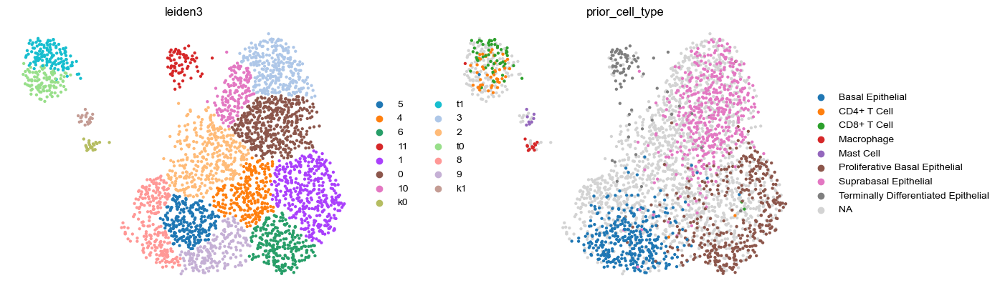

In [88]:
scanpy.pl.umap(rso, color=['leiden3', 'prior_cell_type'], ncols=3, frameon=False)


In [91]:
rso.obs['leiden3'].value_counts()

leiden3
0     430
1     382
2     337
3     295
4     247
5     243
6     242
8     239
9     190
10    154
t1    134
t0    106
11     68
k0     22
k1     20
Name: count, dtype: int64

In [96]:
cell_type_dict = {
    '5': 'Suprabasal Epithelial',
    '6': 'Suprabasal Epithelial',
    '2': 'Suprabasal Epithelial',
    '9': 'Suprabasal Epithelial',
    '7': 'Proliferative Basal Epithelial',
    '3': 'Proliferative Basal Epithelial',
    '4': 'Proliferative Basal Epithelial',
    '0': 'Basal Epithelial',
    '1': 'Basal Epithelial',
    '10': 'Terminally Differentiated Epithelial',
    'k1': 'Mast Cell',
    'k0': 'Macrophage',
    't1': 'CD4+ T Cell',
    't0': 'CD8+ T Cell',
}

cell_type_dict = {
    '5': 'Basal Epithelial',
    '4': 'Proliferative Basal Epithelial',
    '6': 'Proliferative Basal Epithelial',
    '11': 'Terminally Differentiated Epithelial',
    '1': 'Proliferative Basal Epithelial',
    '0': 'Suprabasal Epithelial',
    '10': 'Suprabasal Epithelial',
    'k0': 'Macrophage',
    't1': 'CD8+ T Cell',
    '3': 'Suprabasal Epithelial',
    '2': 'Suprabasal Epithelial',
    't0': 'CD4+ T Cell',
    '8': 'Basal Epithelial',
    '9': 'Basal Epithelial',
    'k1': 'Mast Cell',
}

In [97]:
cell_palette = {
    'Basal Epithelial': '#87CEEB',
    'Proliferative Basal Epithelial': '#76EEC6',
    'Suprabasal Epithelial': '#1C86EE',
    'Terminally Differentiated Epithelial': '#104E8B',
    'Macrophage': '#9966cc',
    'Mast Cell': '#e32636',
    'CD8+ T Cell': '#800000',
    'CD4+ T Cell': '#FF6347',
    'T Cell': '#FF6347',
}



In [98]:
rso.obs['cell_type'] = rso.obs['leiden3'].map(cell_type_dict)

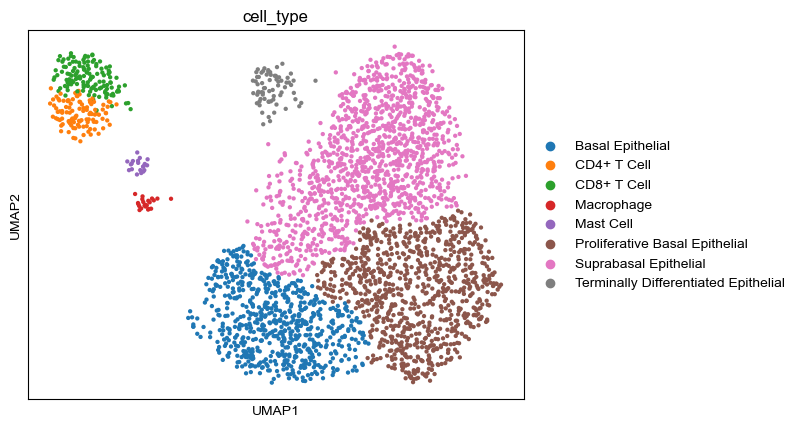

In [99]:
scanpy.pl.umap(rso, color=['cell_type'])

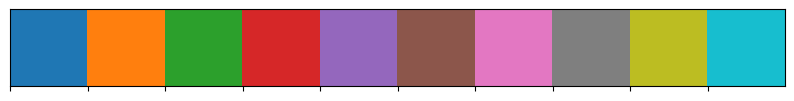

In [100]:
sns.palplot(rso.uns['cell_type_colors'])


In [101]:
rso.uns['cell_type_colors'] = [
    '#87CEEB',
    '#FF6347',
    '#800000',
    '#9966cc',
    '#e32636',
    '#76EEC6',
    '#1C86EE',
    '#104E8B',
]

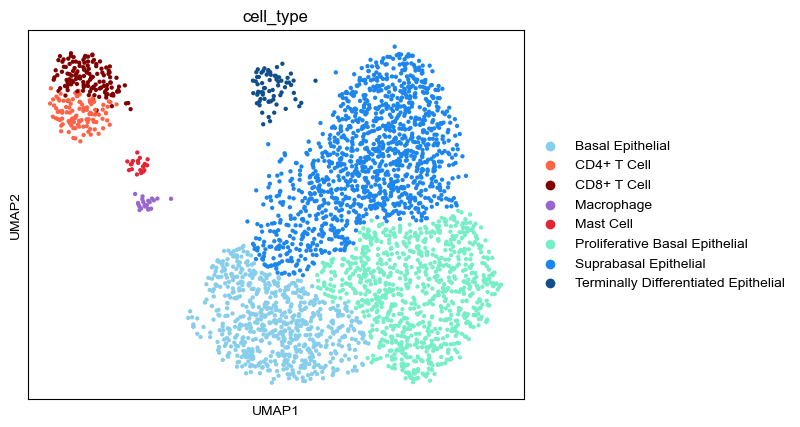

In [102]:
scanpy.pl.umap(rso, color=['cell_type'])

In [103]:
#rso.uns['cell_type_colors'] = list(cell_palette.values())

In [104]:
rso.obs['Cell Type'] = rso.obs['cell_type']


In [105]:
rso.uns['Cell Type_colors'] = [
    '#87CEEB',
    '#FF6347',
    '#800000',
    '#9966cc',
    '#e32636',
    '#76EEC6',
    '#1C86EE',
    '#104E8B',
]

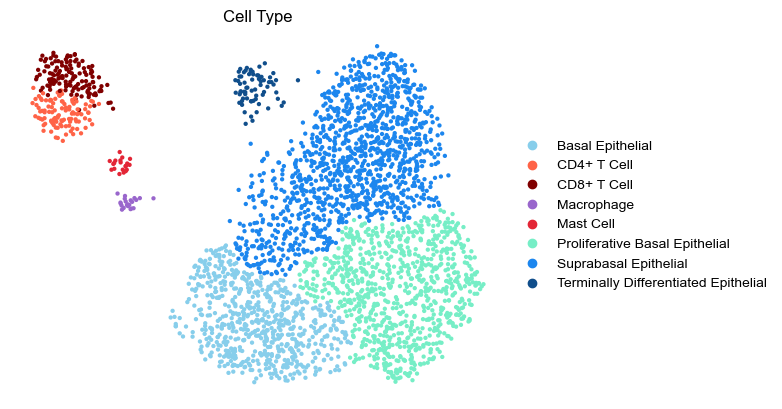

In [106]:
scanpy.pl.umap(rso, color=['Cell Type'], ncols=3, frameon=False, save='_rso_cell_type.pdf')#  save='_rso_cell_type.svg')



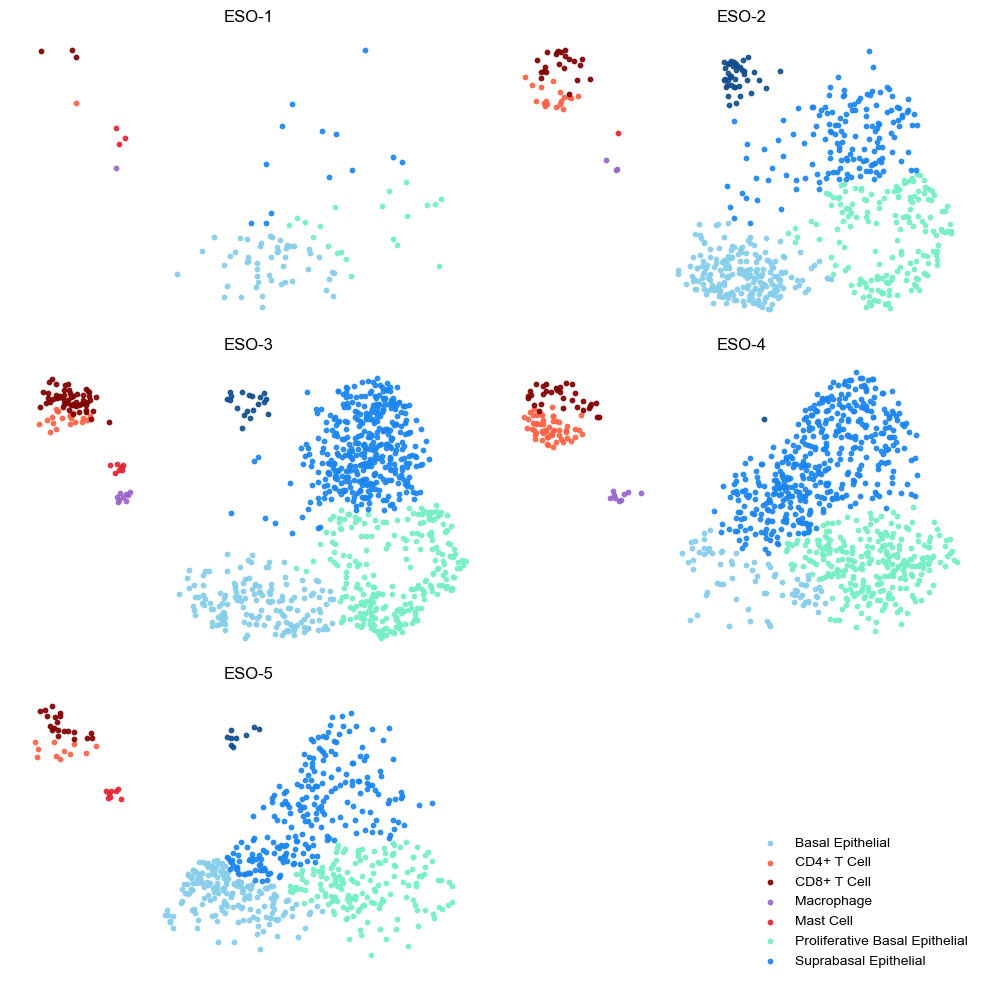

In [107]:
# Get UMAP coordinates, sample information and cell type
umap_data = pd.DataFrame(rso.obsm['X_umap'], columns=['UMAP1', 'UMAP2'])
umap_data['sample'] = rso.obs['sample'].values
umap_data['cell_type'] = rso.obs['cell_type'].values

# Create a figure with subplots for each sample
fig, axes = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)
#fig.suptitle('UMAP by Sample and Cell Type')

# Plot UMAP for each sample
samples = ['eso29', 'cu01', 'cu02', 'cu03', 'cu08']
sample_names = ['ESO-1', 'ESO-2', 'ESO-3', 'ESO-4', 'ESO-5']
cell_type_colors = rso.uns['cell_type_colors']

# To keep track of handles and labels for the legend
handles = []
labels = []

for idx, (sample, name) in enumerate(zip(samples, sample_names)):
    row = idx // 2
    col = idx % 2
    
    # Get data for this sample
    sample_data = umap_data[umap_data['sample'] == sample]
    
    # Plot each cell type with its corresponding color
    for cell_type, color in zip(rso.obs['cell_type'].cat.categories, cell_type_colors):
        cell_data = sample_data[sample_data['cell_type'] == cell_type]
        if not cell_data.empty:
            sc = axes[row, col].scatter(cell_data['UMAP1'], cell_data['UMAP2'],
                                        alpha=0.9, s=10, color=color, label=cell_type)
            # Only collect handles/labels from the first plotted sample/celltype
            if idx == 0:
                handles.append(sc)
                labels.append(cell_type)
    
    axes[row, col].set_title(name)
    axes[row, col].axis('off')

# Remove axis and label from bottom-right subplot -- which is always (2,1)
axes[2, 1].axis('off')
# Add legend to the bottom-right empty plot area
axes[2, 1].legend(handles, labels, frameon=False, loc='lower right', bbox_to_anchor=(1.0, 0), ncol=1)

plt.tight_layout()
plt.savefig('umap_by_sample_celltype.pdf', bbox_inches='tight', dpi=300, transparent=True)


In [97]:
#rso.obs.to_csv('rso_obs.2024.csv')

In [98]:
#pd.DataFrame(rso.obsm['X_umap'], index=rso.obs_names, columns=['UMAP1','UMAP2']).to_csv('rso_umap.2024.csv')



In [89]:
immune_markers = [
    'PTPRC', # CD45, Common leukocyte antigen found on all leukocytes
    'CD4', # T helper cells
    'CD74', # Antigen-presenting cells (B cells, dendritic cells, macrophages)
    'CD8A', # Cytotoxic T cells
    'CD8B', # Cytotoxic T cells
    'CD3E', # T cells
    'CD3D', # T cells
    'CD19', # B cells
    'CD14', # Monocytes and macrophages
    'FOXP3', # Regulatory T cells (Tregs)
    'CD68', # Macrophages
    'CD86', # Macrophages and dendritic cells, costimulatory signal for T-cell activation
    'KIT', # CD117, Mast cells (and also a marker for hematopoietic stem cells)
    'FCER1A', # High-affinity IgE receptor, Mast cells and basophils
    'IL7R', # T cells, especially naive T cells
    'CD2', # T cells, NK cells
    'LTB', # Lymphotoxin beta, involved in the development of secondary lymphoid organs
    'IL1RL1', # ST2, receptor for IL-33, involved in Th2 immune response, mast cells
    'MS4A2', # FcεRIβ, high-affinity IgE receptor beta chain, mast cells and basophils
    'TPSB2', # Tryptase beta-2, mast cell-specific serine protease
    'TPSAB1', # Tryptase alpha/beta-1, mast cell-specific serine protease
    'TPSD1', # Tryptase delta, mast cell-specific serine protease
    'GATA2', # Transcription factor involved in mast cell differentiation
    'CPA3', # Carboxypeptidase A3, mast cell-specific protease
    'FCER1A', # High-affinity IgE receptor, alpha chain, mast cells and basophils
    'SIGLEC8', # Sialic acid-binding Ig-like lectin 8, selectively expressed on eosinophils and mast cells
    'HDC', # Histidine decarboxylase, enzyme responsible for histamine production in mast cells
    'GATA1', # Transcription factor involved in eosinophil differentiation
    'CRLF2', # Cytokine receptor-like factor 2, involved in B cell precursor acute lymphoblastic leukemia
    'RGS13', # Regulator of G-protein signaling 13, expressed in mast cells and regulates mast cell degranulation
]


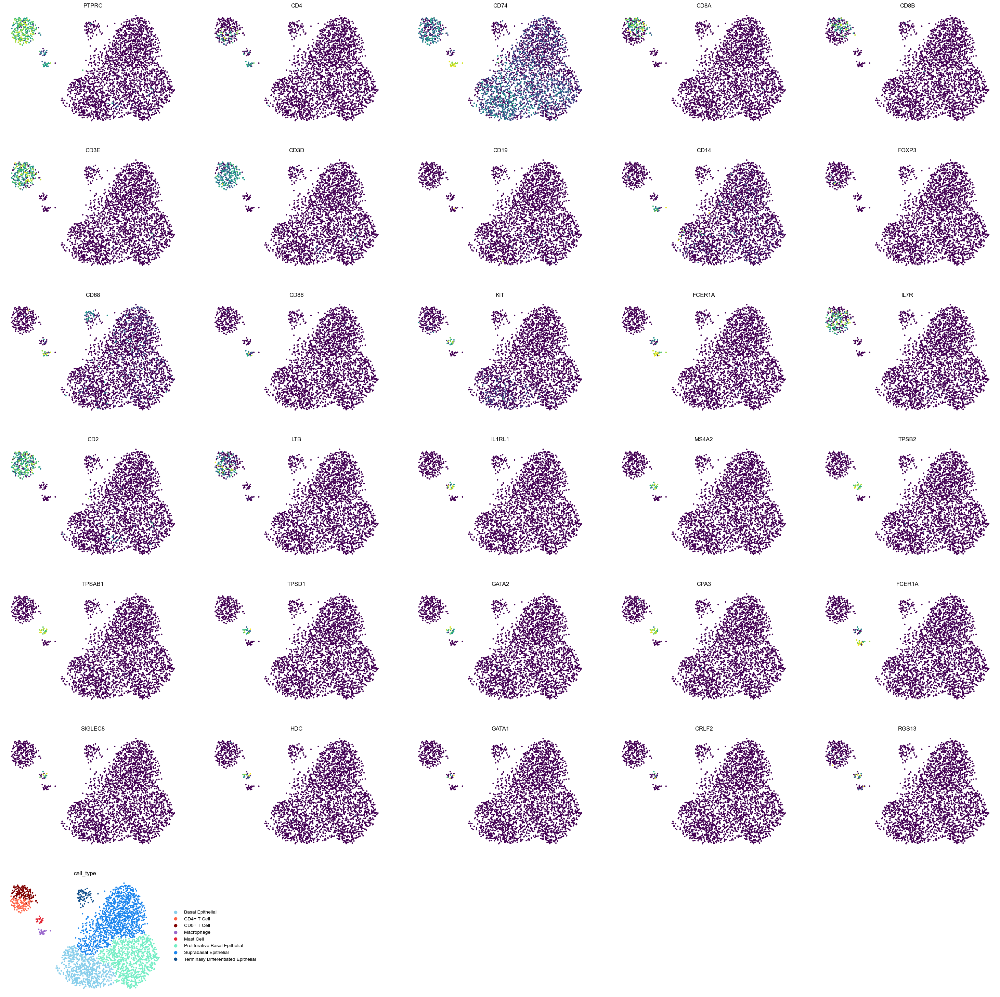

In [108]:
scanpy.pl.umap(rso, color=immune_markers+['cell_type'], ncols=5, frameon=False, colorbar_loc=None)

In [109]:
scanpy.tl.rank_genes_groups(rso, 'cell_type', method='t-test_overestim_var')#method='logreg')

In [110]:
scanpy.tl.dendrogram(rso, groupby='cell_type', use_rep='X_scVI')

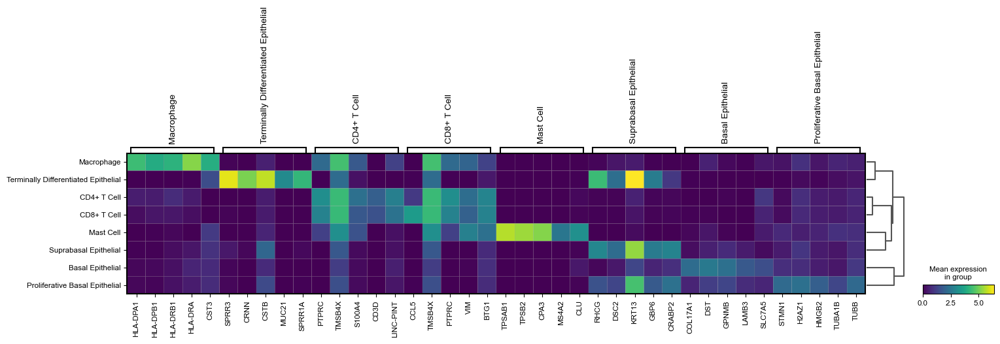

In [ ]:
scanpy.pl.rank_genes_groups_matrixplot(rso, n_genes=5, groupby='cell_type', use_raw=True, swap_axes=False, cmap='viridis',rasterized=False,)# save='_rso.svg')

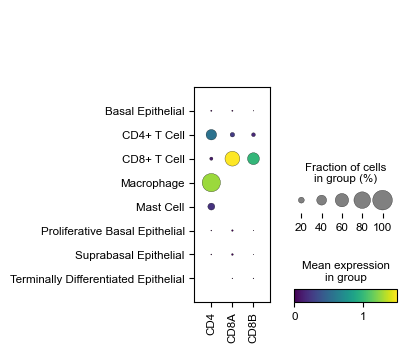

In [ ]:
scanpy.pl.dotplot(rso, ['CD4','CD8A','CD8B'], groupby='cell_type', use_raw=True, cmap='viridis', rasterized=False,)# save='_rso.svg')

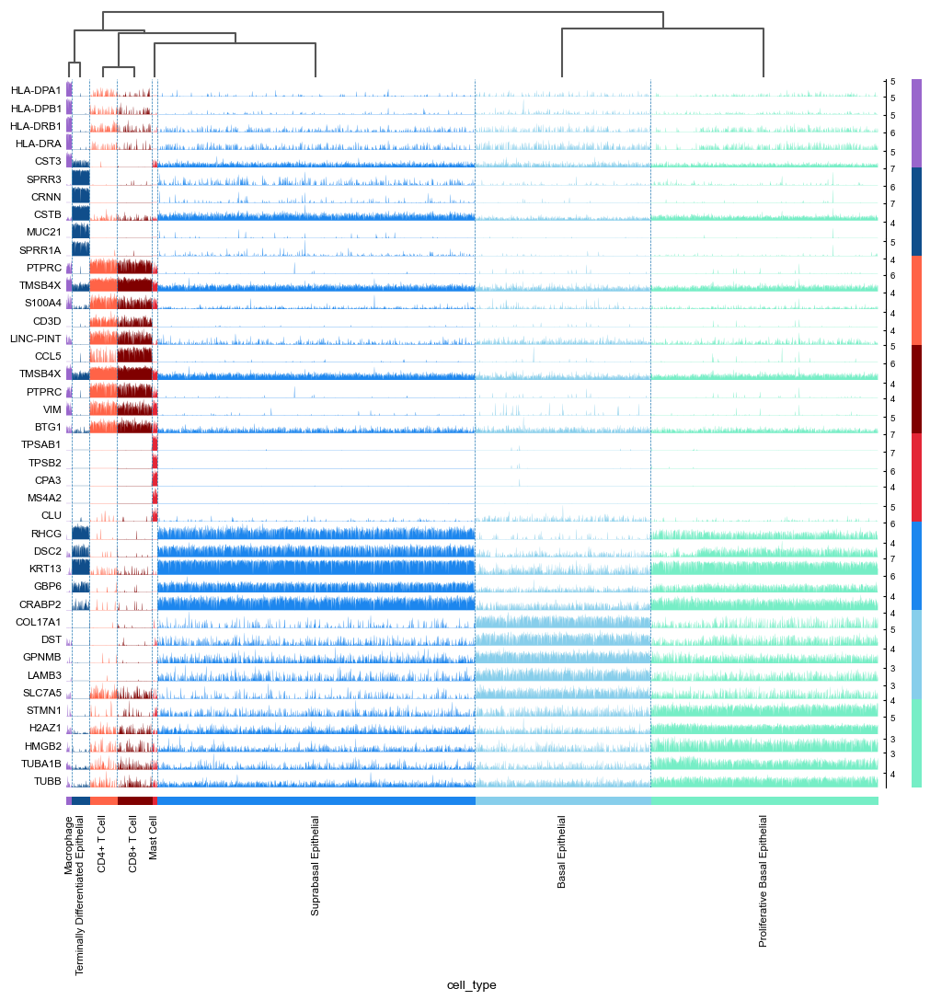

In [ ]:
scanpy.pl.rank_genes_groups_tracksplot(rso, n_genes=5, use_rep='X_scVI', rasterized=False,)# save='_rso.svg')

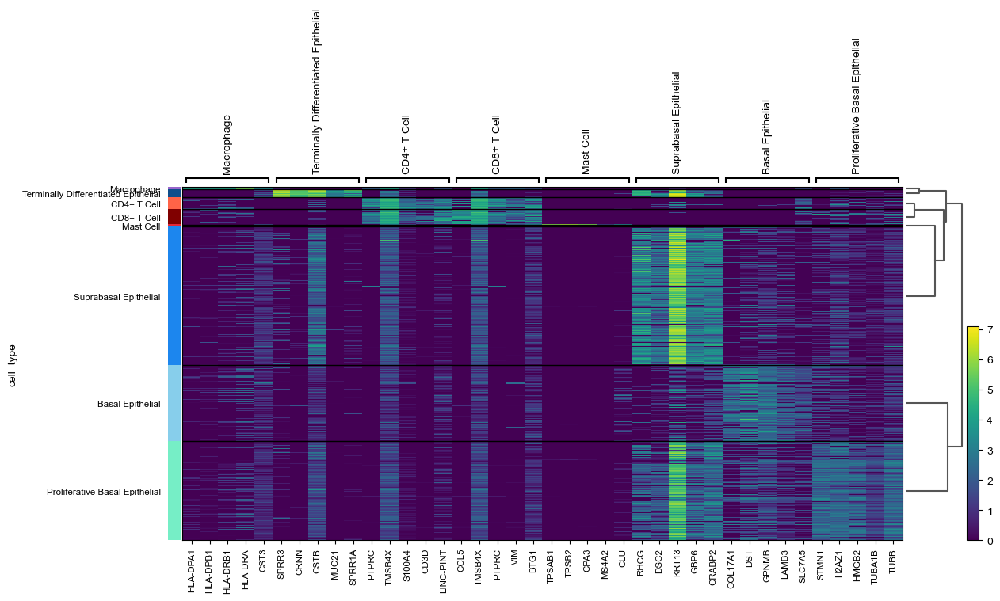

In [ ]:
scanpy.pl.rank_genes_groups_heatmap(rso, n_genes=5, groupby='cell_type', use_raw=True, cmap='viridis', rasterized=False,)#save='_rso.svg')

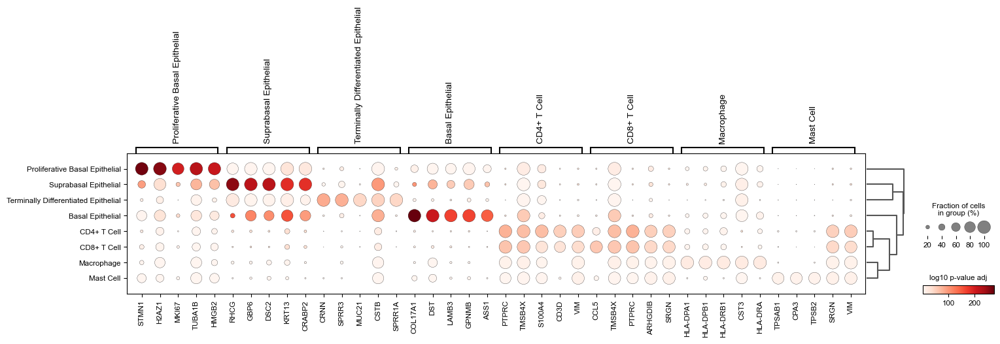

In [160]:
scanpy.pl.rank_genes_groups_dotplot(rso, n_genes=5, values_to_plot='log10_pvals_adj')

In [116]:
scanpy.tl.paga(rso, groups='cell_type')

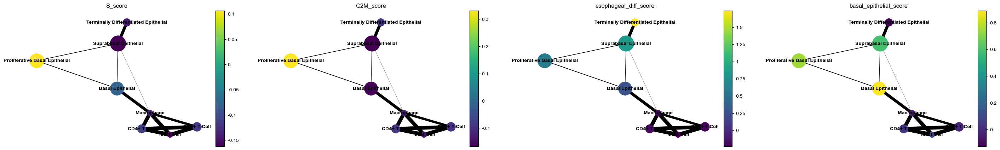

In [117]:
scanpy.pl.paga(rso, color=['S_score', 'G2M_score','esophageal_diff_score','basal_epithelial_score'], threshold=0.01, node_size_scale=2, frameon=False)

In [118]:
#rso.uns['iroot'] = np.flatnonzero(rso.obs['cell_type']  == 'Basal Epithelial')[0]

In [119]:
# Create mask for epithelial cells
epithelial_mask = rso.obs['cell_type'].str.contains('Epithelial')

# Create subset of data with only epithelial cells
rso_epi = rso[epithelial_mask].copy()
rso_epi.uns['iroot'] = np.flatnonzero(rso_epi.obs['cell_type']  == 'Basal Epithelial')[0]
# Run diffmap and dpt on epithelial subset
scanpy.tl.diffmap(rso_epi)
scanpy.tl.dpt(rso_epi)

# Copy results back to main object
rso.obsm['X_diffmap'] = np.zeros((rso.n_obs, rso_epi.obsm['X_diffmap'].shape[1]))
rso.obsm['X_diffmap'][epithelial_mask] = rso_epi.obsm['X_diffmap']
rso.obs.loc[epithelial_mask, 'dpt_pseudotime'] = rso_epi.obs['dpt_pseudotime']

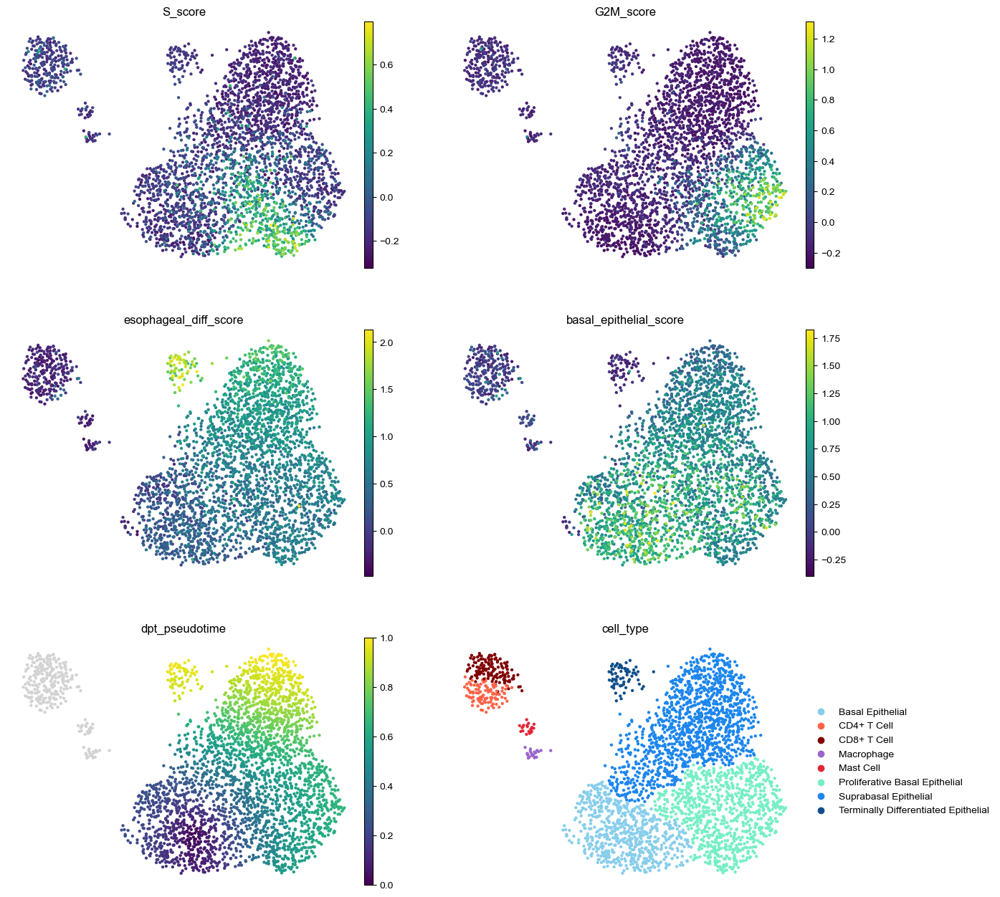

In [ ]:
scanpy.pl.umap(rso, color=[ 'S_score', 'G2M_score','esophageal_diff_score','basal_epithelial_score','dpt_pseudotime','cell_type',], ncols=2, frameon=False,)# save='_rso_cell_type_multi.svg')

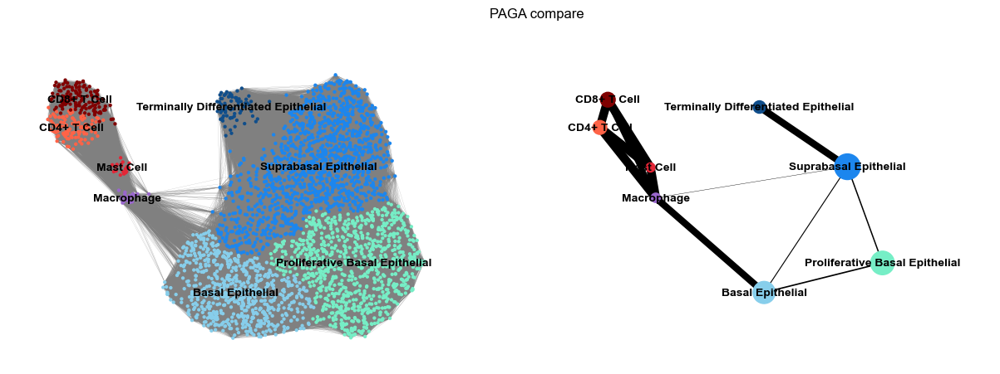

In [122]:
scanpy.pl.paga_compare(
    rso,
    basis="umap",
    edges=True,
    threshold=0.01,
    title="PAGA compare",
    frameon=False,
)

In [123]:
rso.obs['Diffusion Pseudotime'] = rso.obs['dpt_pseudotime']
#rso.obs['Cell Type'] = rso.obs['cell_type']

In [124]:
basal_to_upper = ['Basal Epithelial', 'Suprabasal Epithelial', 'Terminally Differentiated Epithelial']

In [125]:
epi_feat = ["TP63", "ITGA6", "KRT14", "KRT13", "KRT4"]

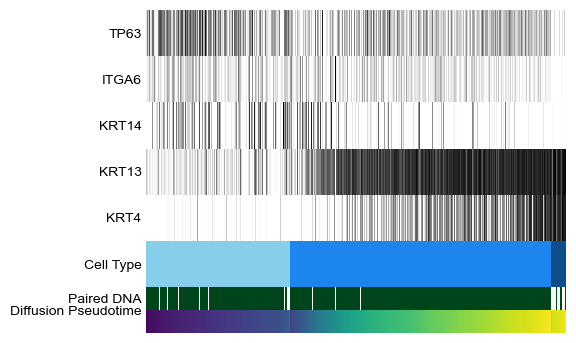

In [126]:
plt.figure(figsize=(6,3))
_, data = scanpy.pl.paga_path(
        rso, 
        nodes = basal_to_upper,
        keys = epi_feat,
        normalize_to_zero_one=True,
        n_avg=1,
        annotations=['Diffusion Pseudotime', 'Paired DNA'],
        show_colorbar=False,
        color_map='Greys',
        groups_key='Cell Type',
        color_maps_annotations={'Diffusion Pseudotime': 'viridis', 'Paired DNA': 'Greens'},
        show_node_names=False,
        return_data=True,
)

In [127]:
filtered_list = data.sum().sort_values(ascending = True).index[10:-1][::-1]

In [128]:
filtered_list

Index([], dtype='object')

In [129]:
sorted_filtered_list = data.iloc[:,:-1].idxmax().sort_values(ascending=False).index

In [130]:
sorted_filtered_list

Index(['KRT4', 'KRT13', 'ITGA6', 'KRT14', 'TP63'], dtype='object')

In [131]:
data.drop(['groups'], axis=1, inplace=True) #

In [132]:
sorted_genes = list(data.dropna(how='all', axis=1,).iloc[:,:].idxmax().sort_values(ascending=False).index)

In [133]:
sorted_genes

['KRT4', 'KRT13', 'ITGA6', 'KRT14', 'TP63']

In [134]:
rso.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 3109 × 1000
    obs: 'sample', 'plate', 'batch', 'well', 'row', 'col', 'replicate', 'region', 'sort', 'cm.from.mouth', 'Paired DNA', 'prior_cell_type', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden', 'S_score', 'G2M_score', 'phase', 'esophageal_diff_score', 'basal_epithelial_score', 'cd8_score', 'cd4_score', 'cd8_cd4_score', 'leiden2', 'leiden3', 'cell_type', 'Cell Type', 'dpt_pseudotime', 'Diffusion Pseudotime'
    var: 'n_counts', 'n_cells', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'batch_colors', 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden', 'sort_colors', 'leiden_colors', 'prior_cell_type_color

In [135]:
rso.obs['% MT'] = rso.obs['pct_counts_mt']
rso.obs['% ribo'] = rso.obs['pct_counts_ribo']


In [136]:
rso.obs[''] = np.zeros(rso.shape[0])

In [137]:
# Swap the first and second items in the list
sorted_genes = [sorted_genes[1], sorted_genes[0]] + sorted_genes[2:]

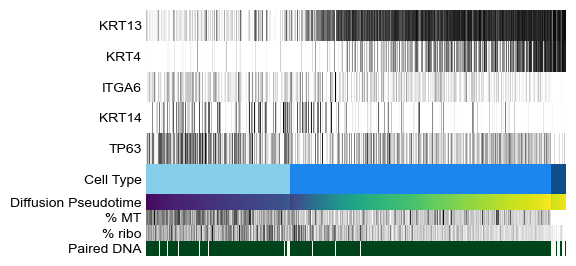

In [138]:
plt.figure(figsize=(6,2))
scanpy.pl.paga_path(
        rso, 
        nodes = basal_to_upper,
        keys = sorted_genes,
        normalize_to_zero_one=True,
        n_avg=1,
        annotations=['','Diffusion Pseudotime','% MT','% ribo','Paired DNA',],
        show_colorbar=False,
        color_map='Greys',
        groups_key='Cell Type',
        color_maps_annotations={'Diffusion Pseudotime': 'viridis', 'Paired DNA': 'Greens'},
        show_node_names=False,
        #save='_epi_noterm_cell_rso.svg'
)



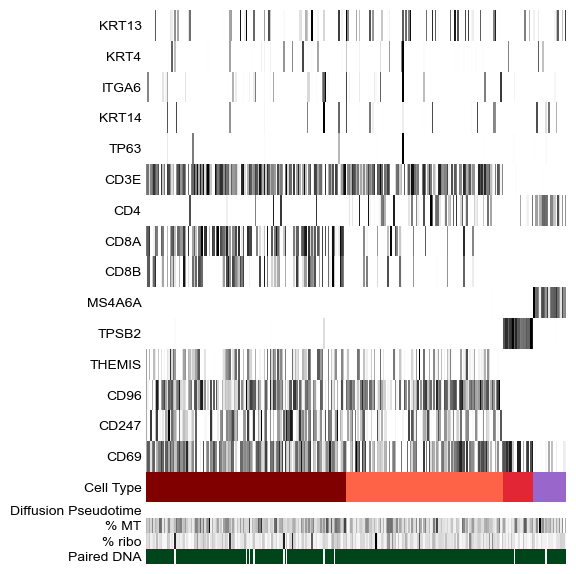

In [139]:
immune_path = ["CD8+ T Cell", "CD4+ T Cell", "Mast Cell", "Macrophage",]
immune_feat = ["CD3E", "CD4", "CD8A", "CD8B", "MS4A6A", "TPSB2", "THEMIS", "CD96", "CD247", "CD69"]
plt.figure(figsize=(6,6))
scanpy.pl.paga_path(
        rso, 
        nodes = immune_path,
        keys = sorted_genes+immune_feat,
        normalize_to_zero_one=True,
        n_avg=1,
        annotations=['','Diffusion Pseudotime','% MT','% ribo','Paired DNA',],
        show_colorbar=False,
        color_map='Greys',
        groups_key='Cell Type',
        color_maps_annotations={'Diffusion Pseudotime': 'viridis', 'Paired DNA': 'Greens'},
        show_node_names=False,
        #save='_immune_all_markers_cell_rso.svg'
)

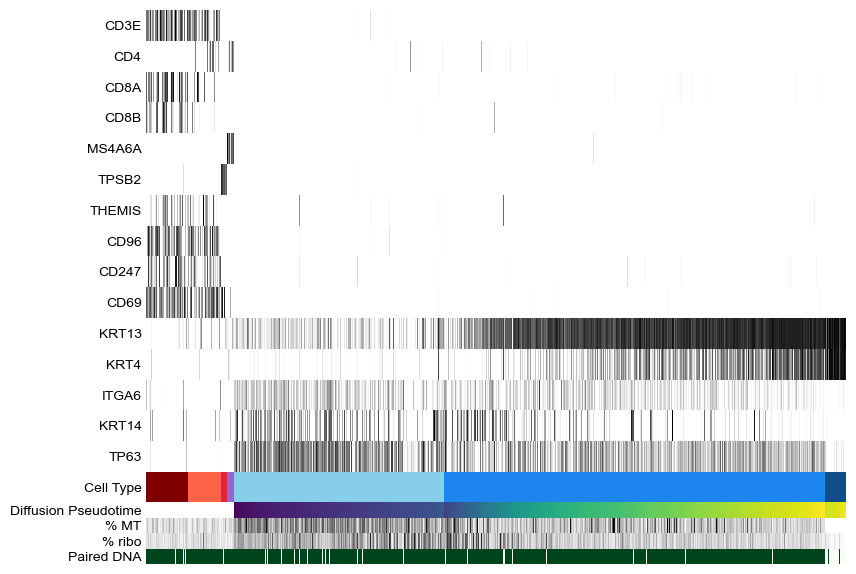

In [ ]:
immune_path = ["CD8+ T Cell", "CD4+ T Cell", "Mast Cell", "Macrophage",]
immune_feat = ["CD3E", "CD4", "CD8A", "CD8B", "MS4A6A", "TPSB2", "THEMIS", "CD96", "CD247", "CD69"]
plt.figure(figsize=(10,6))
scanpy.pl.paga_path(
        rso, 
        nodes = immune_path+basal_to_upper,
        keys = immune_feat+sorted_genes,
        normalize_to_zero_one=True,
        n_avg=1,
        annotations=['','Diffusion Pseudotime','% MT','% ribo','Paired DNA',],
        show_colorbar=False,
        color_map='Greys',
        groups_key='Cell Type',
        color_maps_annotations={'Diffusion Pseudotime': 'viridis', 'Paired DNA': 'Greens'},
        show_node_names=False,
        #save='_all_cell_all_markers_rso.pdf'
)

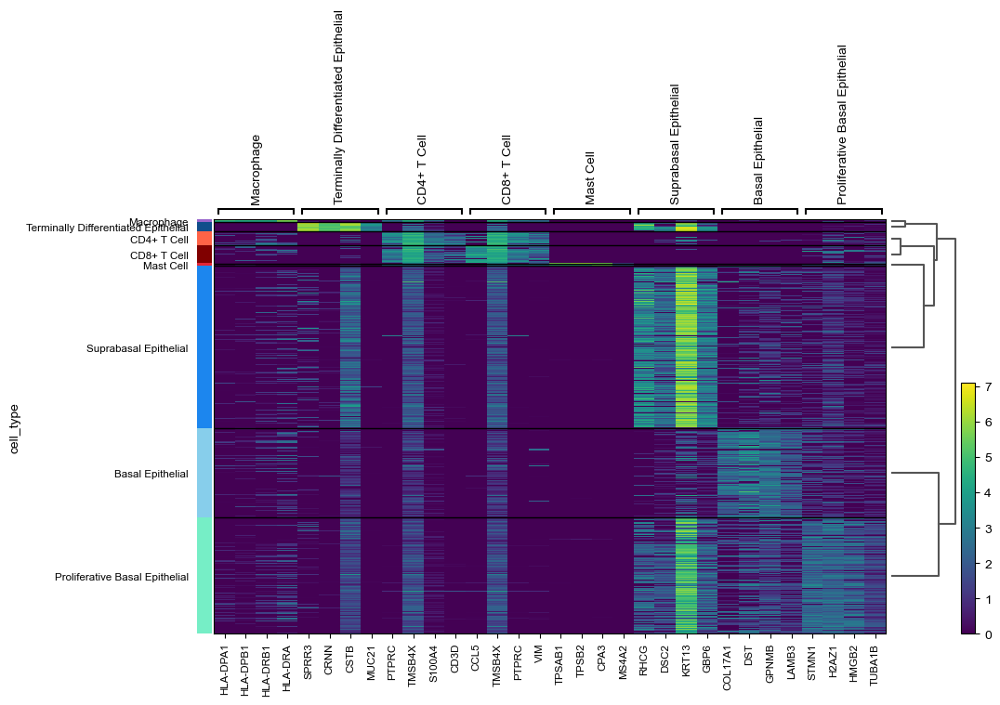

In [141]:
scanpy.pl.rank_genes_groups_heatmap(rso, n_genes=4, groupby='cell_type', use_raw=True, cmap='viridis',swap_axes=False,)

categories: Basal Epithelial, CD4+ T Cell, CD8+ T Cell, etc.
var_group_labels: Basal Epithelial, Proliferative Basal Epithelial, Suprabasal Epithelial, etc.


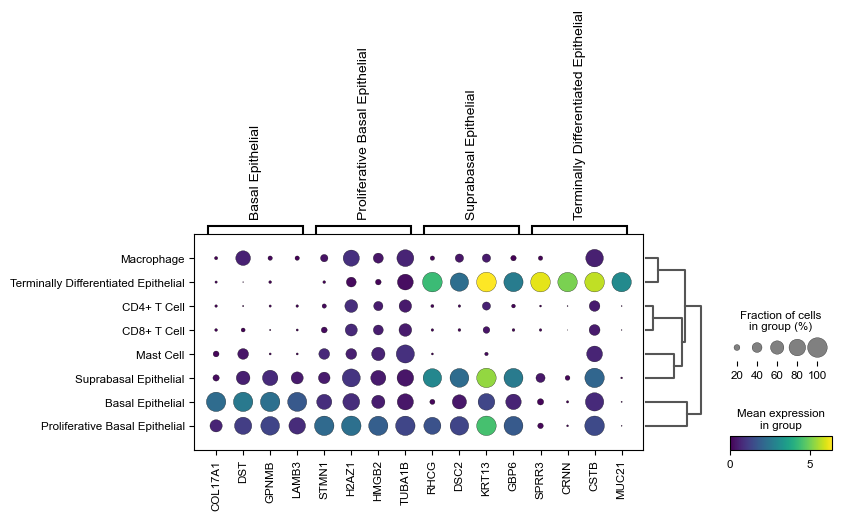

In [142]:
scanpy.pl.rank_genes_groups_dotplot(rso, n_genes=4, groupby='cell_type', groups=[ 'Basal Epithelial', 'Proliferative Basal Epithelial', 'Suprabasal Epithelial', 'Terminally Differentiated Epithelial'], use_raw=True, cmap='viridis',)

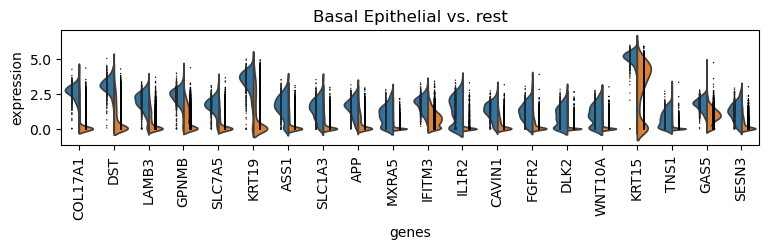

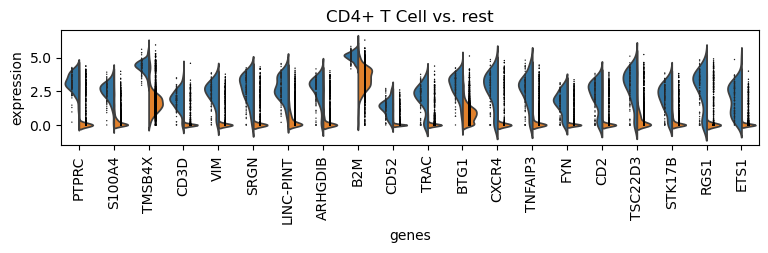

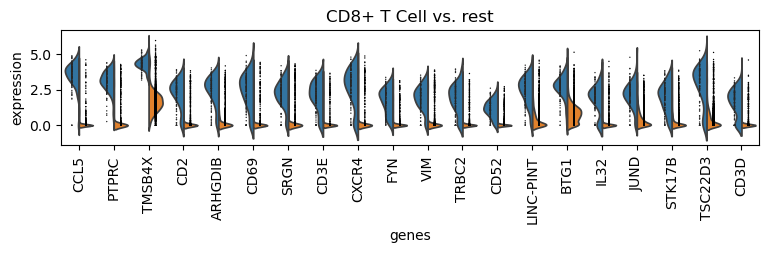

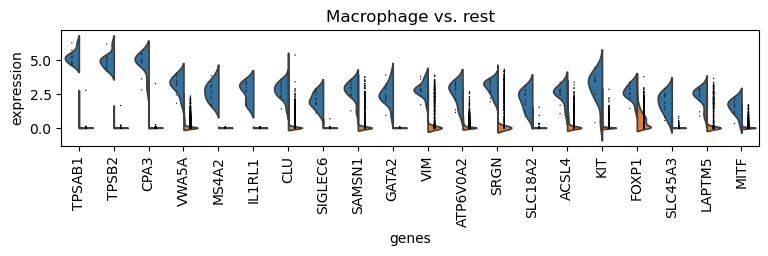

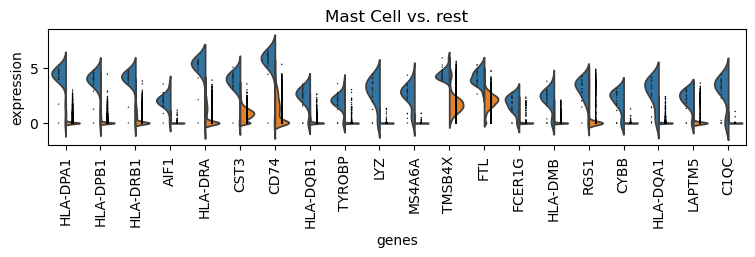

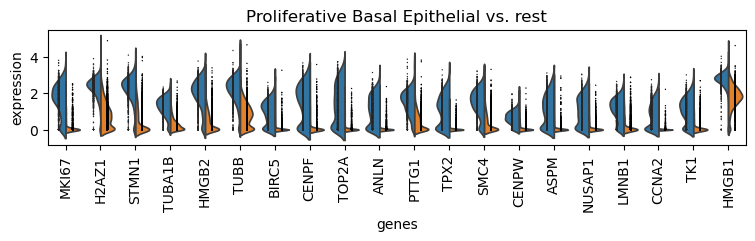

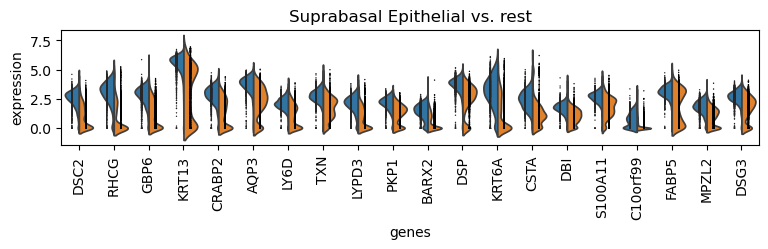

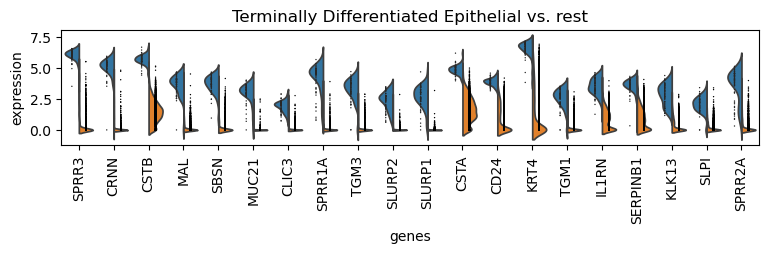

In [107]:
from matplotlib.pyplot import rc_context
with rc_context({"figure.figsize": (9, 1.5)}):
    scanpy.pl.rank_genes_groups_violin(rso, n_genes=20, jitter=False)

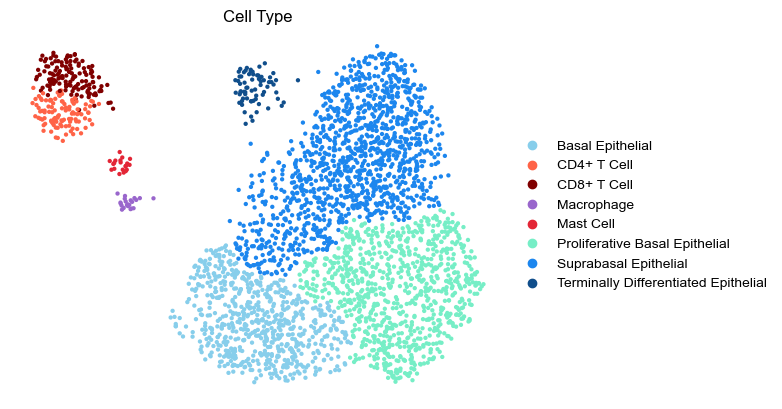

In [143]:
scanpy.pl.umap(rso, color=['Cell Type',], ncols=3, frameon=False, palette=cell_palette,)# save='_cell_type.pdf')



In [144]:
cell_palette

{'Basal Epithelial': '#87CEEB',
 'Proliferative Basal Epithelial': '#76EEC6',
 'Suprabasal Epithelial': '#1C86EE',
 'Terminally Differentiated Epithelial': '#104E8B',
 'Macrophage': '#9966cc',
 'Mast Cell': '#e32636',
 'CD8+ T Cell': '#800000',
 'CD4+ T Cell': '#FF6347',
 'T Cell': '#FF6347'}

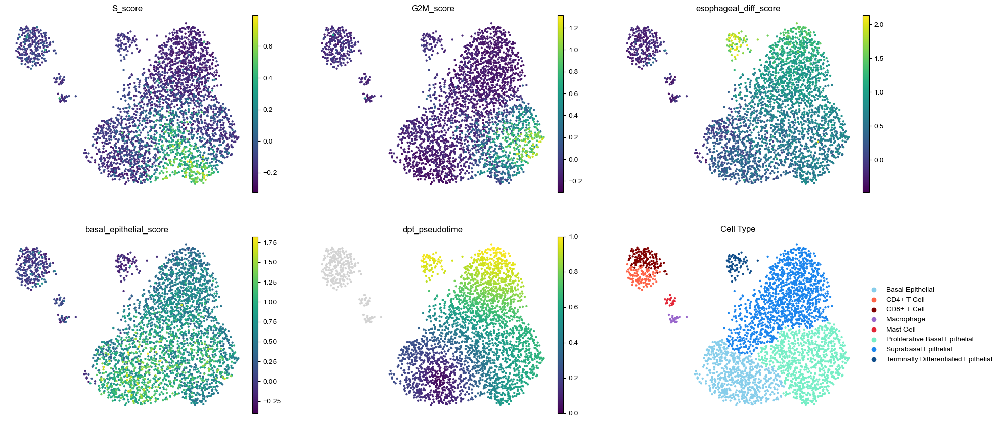

In [ ]:
scanpy.pl.umap(rso, color=[ 'S_score', 'G2M_score','esophageal_diff_score','basal_epithelial_score','dpt_pseudotime','Cell Type',], ncols=3, frameon=False,)# save='_scores_cell_type_cbars.svg',) # colorbar_loc=None)

categories: Basal Epithelial, CD4+ T Cell, CD8+ T Cell, etc.
var_group_labels: Basal Epithelial, Proliferative Basal Epithelial


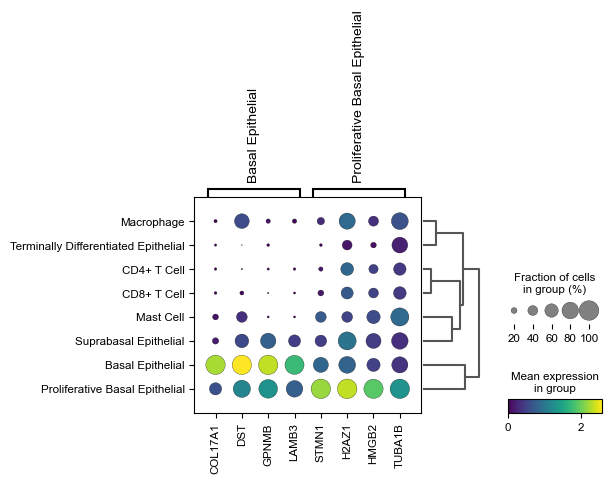

In [146]:
scanpy.pl.rank_genes_groups_dotplot(rso, n_genes=4, groupby='cell_type', groups=[ 'Basal Epithelial', 'Proliferative Basal Epithelial',], use_raw=True, cmap='viridis',)

In [147]:
prolif_markers = [x for x in ['COL17A1', 'COL7A1', 'KRT15', 'IL1R2', 'MKI67', 'STMN1', 'DST'] if x in rso.raw.var_names]

In [148]:
pro = rso[rso.obs['cell_type'].isin(['Basal Epithelial', 'Proliferative Basal Epithelial'])]

In [149]:
prolif_markers

['COL17A1', 'COL7A1', 'KRT15', 'IL1R2', 'MKI67', 'STMN1', 'DST']

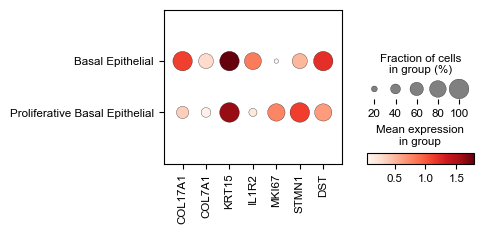

In [150]:
scanpy.pl.dotplot(pro, var_names=prolif_markers, groupby='cell_type', use_raw=True, cmap='Reds', log=True, figsize=(4,2), rasterized=False,)# save='basal_v_pro_vec.svg')

In [151]:
# Calculate the percentage of Basal Epithelial cells expressing MKI67
basal_cells = rso[rso.obs['cell_type'] == 'Basal Epithelial']
total_basal_cells = basal_cells.shape[0]

# Check if MKI67 is in the raw data
if 'MKI67' in rso.raw.var_names:
    # Get expression values from raw data
    mki67_expr = basal_cells.raw[:, 'MKI67'].X
    
    # Count cells with non-zero expression
    mki67_positive_cells = np.sum(mki67_expr > 0)
    
    # Calculate percentage
    percent_mki67_positive = (mki67_positive_cells / total_basal_cells) * 100
    
    print(f"Total Basal Epithelial cells: {total_basal_cells}")
    print(f"Basal Epithelial cells expressing MKI67: {mki67_positive_cells}")
    print(f"Percentage of Basal Epithelial cells expressing MKI67: {percent_mki67_positive:.2f}%")
else:
    print("MKI67 gene not found in the dataset")


Total Basal Epithelial cells: 672
Basal Epithelial cells expressing MKI67: 92
Percentage of Basal Epithelial cells expressing MKI67: 13.69%


In [152]:
rso.obs[rso.obs['cell_type'] == 'Terminally Differentiated Epithelial']['Paired DNA']


cu01_p1r2H13    False
cu01_p1r3L5     False
cu02_p3r2H6     False
cu03_p1r3L5     False
cu01_p1r2E1     False
                ...  
cu08_p3r2D2      True
cu08_p3r4I8      True
cu08_p3r4O16     True
cu08_p3r1G9      True
cu08_p2r2D8      True
Name: Paired DNA, Length: 68, dtype: bool

In [153]:
# Print problematic columns and their dtypes
print(rso.obs.dtypes)

# Check for columns with NaN values
print(rso.obs.isna().sum())

sample                    category
plate                     category
batch                     category
well                      category
row                       category
col                       category
replicate                 category
region                    category
sort                      category
cm.from.mouth             category
Paired DNA                    bool
prior_cell_type           category
n_counts                   float32
n_genes_by_counts            int64
total_counts               float32
total_counts_mt            float32
pct_counts_mt              float32
total_counts_ribo          float32
pct_counts_ribo            float32
_scvi_batch                   int8
_scvi_labels                  int8
leiden                    category
S_score                    float64
G2M_score                  float64
phase                     category
esophageal_diff_score      float64
basal_epithelial_score     float64
cd8_score                  float64
cd4_score           

In [154]:
# Check for unnamed columns and remove them
unnamed_cols = [col for col in rso.obs.columns if col == '']
if unnamed_cols:
    rso.obs = rso.obs.drop(columns=unnamed_cols)
    print(f"Removed {len(unnamed_cols)} unnamed column(s)")
else:
    print("No unnamed columns found")

Removed 1 unnamed column(s)


In [110]:
#scanpy.write('debug.h5ad', rso)

In [111]:
#scanpy.read_h5ad('debug.h5ad')

AnnData object with n_obs × n_vars = 2491 × 1000
    obs: 'sample', 'plate', 'batch', 'well', 'row', 'col', 'replicate', 'region', 'sort', 'cm.from.mouth', 'Paired DNA', 'prior_cell_type', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden', 'S_score', 'G2M_score', 'phase', 'esophageal_diff_score', 'basal_epithelial_score', 'cd8_score', 'cd4_score', 'cd8_cd4_score', 'leiden2', 'leiden3', 'cell_type', 'Cell Type', 'dpt_pseudotime', 'Diffusion Pseudotime', '% MT', '% ribo'
    var: 'n_counts', 'n_cells', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Cell Type_colors', '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'cell_type_colors', 'cell_type_sizes', 'cm.from.mouth_colors', 'dendrogram_cell_type', 'hvg', 'le

In [123]:
#scanpy.pl.umap(rso, color=rso.var_names[rso.var_names.str.contains('KRT')], ncols=3, frameon=False)

In [155]:
scanpy.write('rso_04_08_2026.h5ad', rso)



In [156]:
rso.obs.to_csv('rso_04_08_2026_obs.csv')

In [157]:
pd.DataFrame(rso.raw.X, columns=rso.raw.var_names, index=rso.obs_names).to_csv('rso_04_08_2026_mtx.csv')

In [158]:
pd.DataFrame(rso.obsm['X_umap'], index=rso.obs_names).to_csv('rso_04_08_2026_umap.csv')
pd.DataFrame(rso.obsm['X_scVI'], index=rso.obs_names).to_csv('rso_04_08_2026_scVI_latent.csv')